<a href="https://colab.research.google.com/github/RatnaWijiLestari/CRISP-DM-Methodology/blob/main/LoanCapableRepaymentClassification/FinPro_DA_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Business Understanding**

---


Hidup di zaman yang serba membutuhkan uang, banyak orang menjadikan pinjaman uang sebagai opsi untuk memenuhi kebutuhan yang belum memungkinkan untuk ditransaksikan dengan uang tunai. *Borrowers* atau sang peminjam seringkali dikaitkan dengan orang yang kekurangan uang. Padahal, banyak juga orang yang lebih memilih meminjam uang karena mengalokasikan sebagian besar uangnya untuk tabungan atau dana darurat.

*Home Credit* menawarkan solusi peminjaman uang yang mudah dan aman dengan berbagai layanan yang ditawarkan. *Home Credit* dan peminjamnya merupakan hubungan timbal balik yang saling menguntungkan. Namun, saat ternyata ada peminjam yang tidak sanggup membayar kewajibannya melebihi jatuh tempo, pihak *Home Credit* akan merasakan kerugian karena perputaran uang yang terhambat. Peminjam yang default (gagal bayar) akan tertolak seleksinya bisa karena tidak adanya *history credit*. Maka dari itu, perlu dan penting bagi *Home Credit* untuk memastikan setiap peminjam adalah kredibel untuk diberi pinjaman. Melalui solusi *data science*, sistem peminjaman uang dapat dijadikan otomasi untuk memprediksi apakah *applicant* layak untuk disetujui pinjamannya atau tidak.

**Tujuan** implementasi solusi *data science* untuk permasalahan Home Credit ini adalah:
- Mengidentifikasi pola atau karakteristik *applicant* yang berpeluang *default* (tidak bisa membayar pinjaman)
- Membuat model yang memprediksi kapabilitas *applicant* untuk bisa membayar pinjaman atau tidak

# **Import Library**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

from sklearn import metrics

from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest #feature selection
from sklearn.feature_selection import chi2
from sklearn.utils import resample #re-sampling
from sklearn.model_selection import train_test_split #data splitting
from sklearn.preprocessing import StandardScaler #normalize features

from sklearn.linear_model import LogisticRegression #logistic regression
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier #decision tree
from sklearn.ensemble import RandomForestClassifier #random forest
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier #xgboost
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import roc_curve, roc_auc_score #roc score

from imblearn.over_sampling import RandomOverSampler

pd.set_option('display.max_rows', None) #menampilkan seluruh baris pada dataframe
pd.set_option('display.max_columns', None) #menampilkan seluruh kolom pada dataframe

# **Import Dataset**

In [ ]:
# Menghubungkan google colab ke grive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#import dataset application train
train = pd.read_csv('/content/drive/MyDrive/application_train.csv')
train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [ ]:
#import dataset bureau
bureau = pd.read_csv('/content/drive/MyDrive/bureau.csv')
bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [ ]:
train = pd.read_csv('/content/drive/MyDrive/MSIB/Dataset Finpro DA/Dataset/application_train.csv')
bureau = pd.read_csv('/content/drive/MyDrive/MSIB/Dataset Finpro DA/Dataset/bureau.csv')

In [ ]:
train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [ ]:
bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [ ]:
# Membuat variabel bureau loan
bureau_loan = bureau.groupby(['SK_ID_CURR'])['SK_ID_CURR'].agg(['count']).reset_index()
bureau_loan.columns = ['SK_ID_CURR','TOTAL_BUREAU_LOAN']
bureau_loan.head()

,SK_ID_CURR,TOTAL_BUREAU_LOAN
0,100001,7
1,100002,8
2,100003,4
3,100004,2
4,100005,3


Menggabungkan data application_train dan bureau menggunakan left join

In [ ]:
df = train.merge(bureau_loan, how='left', on='SK_ID_CURR')
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

# **Data Understanding**

## Feature Description

1.	SK_ID_CURR: ID pinjaman yang ada di Home Credit saat ini.
2.	TARGET: Variabel target (1 - klien yang memiliki kesulitan pembayaran: klien tersebut mengalami keterlambatan pembayaran lebih dari X hari  setidaknya satu dari cicilan Y pertama dari pinjaman di Home Credit saat ini, 0 - semua kasus lainnya).
3.	NAME_CONTRACT_TYPE: Identifikasi apakah pinjaman tersebut tunai atau bergulir.
4.	CODE_GENDER: Jenis kelamin klien.
5.	FLAG_OWN_CAR: Tandai jika klien memiliki mobil.
6.	FLAG_OWN_REALTY: Tandai jika klien memiliki rumah atau apartemen.
7.	CNT_CHILDREN: Jumlah anak yang dimiliki klien.
8.	AMT_INCOME_TOTAL: Penghasilan yang dimiliki klien
9.	AMT_CREDIT: Jumlah kredit dari pinjaman
10.	AMT_ANNUITY: Anuitas pinjaman
11.	AMT_GOODS_PRICE: Untuk pinjaman konsumen, itu adalah harga barang yang diberikan pinjaman
12.	NAME_TYPE_SUITE: Siapa yang menemani klien saat dia mengajukan pinjaman
13.	NAME_INCOME_TYPE: Jenis pendapatan klien (pengusaha, bekerja, cuti melahirkan,…)
14.	NAME_EDUCATION_TYPE: Tingkat pendidikan tertinggi yang dicapai klien
15.	NAME_FAMILY_STATUS: Status keluarga klien
16.	NAME_HOUSING_TYPE: Bagaimana situasi perumahan klien (sewa, tinggal bersama orang tua, ...)
17. REGION_POPULATION_RELATIVE: tingkat kepadatan penduduk di wilayah tempat klien tinggal
18.	DAYS_BIRTH: Usia klien pada hari pengisian aplikasi
19.	DAYS_EMPLOYED: Berapa hari sebelum melamar orang tersebut memulai pekerjaan saat ini
20.	DAYS_REGISTRATION: Berapa hari sebelum aplikasi klien mengubah pendaftarannya
21.	DAYS_ID_PUBLISH: Berapa hari sebelum aplikasi, klien mengubah dokumen identitas yang digunakannya untuk mengajukan pinjaman
22.	OWN_CAR_AGE: Usia mobil klien
23.	FLAG_MOBIL: Apakah klien menyediakan ponsel (1=YA, 0=TIDAK)
24.	FLAG_EMP_PHONE: Apakah klien menyediakan telepon kantor (1=YA, 0=TIDAK)
25.	FLAG_WORK_PHONE: Apakah klien menyediakan telepon rumah (1=YA, 0=TIDAK)
26.	FLAG_CONT_MOBILE: Apakah ponsel dapat dijangkau (1=YA, 0=TIDAK)
27.	FLAG_PHONE: Apakah klien menyediakan telepon rumah (1=YA, 0=TIDAK)
28.	FLAG_EMAIL: Apakah klien memberikan email (1=YA, 0=TIDAK)
29.	OCCUPATION_TYPE: Jenis pekerjaan apa yang dimiliki klien
30.	CNT_FAM_MEMBERS: Berapa jumlah anggota keluarga yang dimiliki klien
31.	REGION_RATING_CLIENT: Peringkat kami untuk wilayah tempat tinggal klien (1,2,3)
32.	REGION_RATING_CLIENT_W_CITY: Peringkat kami untuk wilayah tempat klien tinggal dengan mempertimbangkan kota (1,2,3)
33.	WEEKDAY_APPR_PROCESS_START: Pada hari apa klien mengajukan pinjaman
34.	HOUR_APPR_PROCESS_START: Pada jam berapa klien mengajukan pinjaman
35.	REG_REGION_NOT_LIVE_REGION: Tandai jika alamat tetap klien tidak cocok dengan alamat kontak (1=berbeda, 0=sama, di tingkat wilayah)
36.	REG_REGION_NOT_WORK_REGION: Tandai jika alamat tetap klien tidak cocok dengan alamat kantor (1=berbeda, 0=sama, di tingkat wilayah)
37.	LIVE_REGION_NOT_WORK_REGION: Tandai jika alamat kontak klien tidak cocok dengan alamat kantor (1=berbeda, 0=sama, di tingkat wilayah)
38.	REG_CITY_NOT_LIVE_CITY: Tandai jika alamat tetap klien tidak cocok dengan alamat kontak (1=berbeda, 0=sama, di tingkat kota)
39.	REG_CITY_NOT_WORK_CITY: Tandai jika alamat tetap klien tidak cocok dengan alamat kantor (1=berbeda, 0=sama, di tingkat kota)
40.	LIVE_CITY_NOT_WORK_CITY: Tandai jika alamat kontak klien tidak cocok dengan alamat kantor (1=berbeda, 0=sama, di tingkat kota)
41.	ORGANIZATION_TYPE: Jenis organisasi tempat klien bekerja
42.	EXT_SOURCE_1: Skor yang dinormalisasi dari sumber data eksternal
43.	EXT_SOURCE_2: Skor yang dinormalisasi dari sumber data eksternal
44.	EXT_SOURCE_3: Skor yang dinormalisasi dari sumber data eksternal
45.	APARTMENTS_AVG: rata-rata luas apartemen di kompleks tempat klien tinggal.
46.	BASEMENTAREA_AVG: rata-rata luas ruang bawah tanah (basement) di kompleks tempat tinggal klien.
47.	YEARS_BEGINEXPLUATATION_AVG:  tahun awal dari pengoperasian kompleks tempat tinggal klien.
48.	YEARS_BUILD_AVG : usia rata-rata bangunan di kompleks tempat tinggal klien
49.	COMMONAREA_AVG : rata-rata luas area umum (common area) di kompleks tempat tinggal klien. Area umum ini meliputi fasilitas dan ruang bersama yang dapat digunakan oleh penghuni kompleks, seperti lobi, ruang pertemuan, atau taman.
50.	ELEVATORS_AVG: rata-rata jumlah lift di kompleks tempat tinggal klien
51.	ENTRANCES_AVG: rata-rata jumlah pintu masuk di kompleks tempat tinggal klien
52.	FLOORSMAX_AVG: rata-rata jumlah lantai maksimum di kompleks tempat tinggal klien
53.	FLOORSMIN_AVG: rata-rata jumlah lantai minimum di kompleks tempat tinggal klien.
54. LANDAREA_MEDI: Median luas area tanah di kompleks tempat tinggal klien.
55. LIVINGAPARTMENTS_MEDI: Median luas unit apartemen tinggal di kompleks tempat tinggal klien.
56. LIVINGAREA_MEDI: Median luas area tinggal di kompleks tempat tinggal klien.
57. NONLIVINGAPARTMENTS_AVG: Rata-rata luas unit apartemen non-tinggal di kompleks tempat tinggal klien.
58. NONLIVINGAREA_AVG: Rata-rata luas area non-tinggal di kompleks tempat tinggal klien.
59. APARTMENTS_MODE: Modus (nilai yang paling sering muncul) luas unit apartemen di kompleks tempat tinggal klien.
60. BASEMENTAREA_MODE: Modus luas ruang bawah tanah (basement) di kompleks tempat tinggal klien.
61. YEARS_BEGINEXPLUATATION_MODE: Modus tahun awal pengoperasian kompleks tempat tinggal klien.
62. YEARS_BUILD_MODE: Modus tahun pembangunan kompleks tempat tinggal klien.
63. COMMONAREA_MODE: Modus luas area umum (common area) di kompleks tempat tinggal klien
64. ELEVATORS_MODE: Modus jumlah lift di kompleks tempat tinggal klien.
65. ENTRANCES_MODE: Modus jumlah pintu masuk di kompleks tempat tinggal klien.
66. FLOORSMAX_MODE: Modus jumlah lantai maksimum di kompleks tempat tinggal klien.
67. FLOORSMIN_MODE: Modus jumlah lantai minimum di kompleks tempat tinggal klien.
68. LANDAREA_MODE: Modus luas area tanah di kompleks tempat tinggal klien.
69. LIVINGAPARTMENTS_MODE: Modus luas unit apartemen tinggal di kompleks tempat tinggal klien
70. LIVINGAREA_MODE: Modus luas area tinggal di kompleks tempat tinggal klien.
71. NONLIVINGAPARTMENTS_MODE: Modus luas unit apartemen non-tinggal di kompleks tempat tinggal klien.
72. NONLIVINGAREA_MODE: Modus luas area non-tinggal di kompleks tempat tinggal klien seperti area komersial, area parkir, atau area terbuka lainnya di kompleks tersebut.
73. APARTMENTS_MEDI: Median luas unit apartemen di kompleks tempat tinggal klien.
74. BASEMENTAREA_MEDI: Median luas ruang bawah tanah (basement) di kompleks tempat tinggal klien.
75. YEARS_BEGINEXPLUATATION_MEDI: Median tahun awal pengoperasian kompleks tempat tinggal klien
76. YEARS_BUILD_MEDI: Median tahun pembangunan kompleks tempat tinggal klien
77. COMMONAREA_MEDI: Median luas area umum (common area) di kompleks tempat tinggal klien.
78. ELEVATORS_MEDI: Median jumlah lift di kompleks tempat tinggal klien.
79. ENTRANCES_MEDI: Median jumlah pintu masuk di kompleks tempat tinggal klien.
80. FLOORSMAX_MEDI: Median jumlah lantai maksimum di kompleks tempat tinggal klien
81. FLOORSMIN_MEDI: Median jumlah lantai minimum di kompleks tempat tinggal klien
82. LANDAREA_MEDI: Median luas area tanah di kompleks tempat tinggal klien
83. LIVINGAPARTMENTS_MEDI: Median luas unit apartemen tinggal di kompleks tempat tinggal klien.
84. LIVINGAREA_MEDI: Median luas area tinggal di kompleks tempat tinggal klien.
85. NONLIVINGAPARTMENTS_MEDI: Median luas unit apartemen non-tinggal di kompleks tempat tinggal klien.
86. NONLIVINGAREA_MEDI: Median luas area non-tinggal di kompleks tempat tinggal klien.
87. FONDKAPREMONT_MODE: Mode pengelolaan dana perbaikan dan perawatan (Fond kapremont) kompleks tempat tinggal klien.
88. HOUSETYPE_MODE: Mode tipe rumah di kompleks tempat tinggal klien.
89. TOTALAREA_MODE: Mode luas total area di kompleks tempat tinggal klien.
90. WALLSMATERIAL_MODE: Mode material dinding di kompleks tempat tinggal klien
91. EMERGENCYSTATE_MODE: Mode status keadaan darurat di kompleks tempat tinggal klien.
92. OBS_30_CNT_SOCIAL_CIRCLE: Jumlah pengamatan dalam 30 hari terakhir terhadap klien dalam lingkaran sosialnya.
93. DEF_30_CNT_SOCIAL_CIRCLE: Jumlah kegagalan pembayaran dalam 30 hari terakhir dalam lingkaran sosial klien.
94. OBS_60_CNT_SOCIAL_CIRCLE: Jumlah pengamatan dalam 60 hari terakhir terhadap klien dalam lingkaran sosialnya.
95. DEF_60_CNT_SOCIAL_CIRCLE: Jumlah kegagalan pembayaran dalam 60 hari terakhir dalam lingkaran sosial klien.
96. DAYS_LAST_PHONE_CHANGE: Jumlah hari sejak perubahan terakhir pada nomor telepon klien.
97. FLAG_DOCUMENT_2: apakah klien memberikan dokumen kedua.
98. FLAG_DOCUMENT_3: apakah klien memberikan dokumen ketiga.
99. FLAG_DOCUMENT_4: apakah klien memberikan dokumen keempat.
100. FLAG_DOCUMENT_5: apakah klien memberikan dokumen kelima.
101. FLAG_DOCUMENT_6: apakah klien memberikan dokumen ke-6.
102. FLAG_DOCUMENT_7: apakah klien memberikan dokumen ke-7.
103. FLAG_DOCUMENT_8: apakah klien memberikan dokumen ke-8.
104. FLAG_DOCUMENT_9: apakah klien memberikan dokumen ke-9.
105. FLAG_DOCUMENT_10: apakah klien memberikan dokumen ke-10.
106. FLAG_DOCUMENT_11: apakah klien memberikan dokumen ke-11.
107. FLAG_DOCUMENT_12: apakah klien memberikan dokumen ke-12.
108. FLAG_DOCUMENT_13: apakah klien memberikan dokumen ke-13.
109. FLAG_DOCUMENT_14: apakah klien memberikan dokumen ke-14.
110. FLAG_DOCUMENT_15: apakah klien memberikan dokumen ke-15.
111. FLAG_DOCUMENT_16: apakah klien memberikan dokumen ke-16.
112. FLAG_DOCUMENT_17: apakah klien memberikan dokumen ke-17.
113. FLAG_DOCUMENT_18: apakah klien memberikan dokumen ke-18.
114. FLAG_DOCUMENT_19: apakah klien memberikan dokumen ke-19.
115. FLAG_DOCUMENT_20: apakah klien memberikan dokumen ke-20.
116. FLAG_DOCUMENT_21: apakah klien memberikan dokumen ke-21.
117. AMT_REQ_CREDIT_BUREAU_HOUR: Jumlah permintaan yang dilakukan ke biro kredit oleh klien dalam waktu satu jam terakhir.
118. AMT_REQ_CREDIT_BUREAU_DAY: Jumlah permintaan yang dilakukan ke biro kredit oleh klien dalam satu hari terakhir.
119. AMT_REQ_CREDIT_BUREAU_WEEK: Jumlah permintaan yang dilakukan ke biro kredit oleh klien dalam satu minggu terakhir.
120. AMT_REQ_CREDIT_BUREAU_MON: Jumlah permintaan yang dilakukan ke biro kredit oleh klien dalam satu bulan terakhir.
121. AMT_REQ_CREDIT_BUREAU_QRT: Jumlah permintaan yang dilakukan ke biro kredit oleh klien dalam satu kuartal (tiga bulan) terakhir.
122. AMT_REQ_CREDIT_BUREAU_YEAR: Jumlah permintaan yang dilakukan ke biro kredit oleh klien dalam satu tahun terakhir.
123. TOTAL_BUREAU_LOAN: Jumlah total pinjaman yang tercatat dalam riwayat kredit klien di biro kredit.


## Introduction Dataframe

In [ ]:
#menampilkan jumlah kolom dan baris dalam dataframe
df.shape

(307511, 123)

In [ ]:
#menampilkan kolom dari dataset
df.columns.values

array(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
       'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE',
       'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1',
       'EXT_SOURCE_2', 'EXT_SOURCE_3',

In [ ]:
#memeriksa data duplikat
df.duplicated().sum()

0

Dataset ini tidak memiliki data duplikat

In [ ]:
#melihat tipe data pada variabel yang ada
df.dtypes.value_counts()

float64    66
int64      41
object     16
dtype: int64

* Terdapat 66 feature yang memiliki tipe data float
* Terdapat 41 feature yang memiliki tipe data integer
* Terdapat 16 feature yang memiliki tipe data object

In [ ]:
#mengelompokkan data kategorik dan numerik
cats=[i for i in df.columns if df[i].dtype=='object' and i not in ['TARGET']]
nums=[i for i in df.columns if df[i].dtype!='object']

In [ ]:
#summary pendekatan numerik
df[nums].describe().T

,count,mean,std,min,25%,50%,75%,max
SK_ID_CURR,307511.0,278180.518577,102790.175348,1.000020e+05,189145.500000,278202.000000,367142.500000,4.562550e+05
TARGET,307511.0,0.080729,0.272419,0.000000e+00,0.000000,0.000000,0.000000,1.000000e+00
CNT_CHILDREN,307511.0,0.417052,0.722121,0.000000e+00,0.000000,0.000000,1.000000,1.900000e+01
AMT_INCOME_TOTAL,307511.0,168797.919297,237123.146279,2.565000e+04,112500.000000,147150.000000,202500.000000,1.170000e+08
AMT_CREDIT,307511.0,599025.999706,402490.776996,4.500000e+04,270000.000000,513531.000000,808650.000000,4.050000e+06
AMT_ANNUITY,307499.0,27108.573909,14493.737315,1.615500e+03,16524.000000,24903.000000,34596.000000,2.580255e+05
AMT_GOODS_PRICE,307233.0,538396.207429,369446.460540,4.050000e+04,238500.000000,450000.000000,679500.000000,4.050000e+06
REGION_POPULATION_RELATIVE,307511.0,0.020868,0.013831,2.900000e-04,0.010006,0.018850,0.028663,7.250800e-02
DAYS_BIRTH,307511.0,-16036.995067,4363.988632,-2.522900e+04,-19682.000000,-15750.000000,-12413.000000,-7.489000e+03
DAYS_EMPLOYED,307511.0,63815.045904,141275.766519,-1.791200e+04,-2760.000000,-1213.000000,-289.000000,3.652430e+05


In [ ]:
#summary pendekatan kategorik
df[cats].describe().T

,count,unique,top,freq
NAME_CONTRACT_TYPE,307511,2,Cash loans,278232
CODE_GENDER,307511,3,F,202448
FLAG_OWN_CAR,307511,2,N,202924
FLAG_OWN_REALTY,307511,2,Y,213312
NAME_TYPE_SUITE,306219,7,Unaccompanied,248526
NAME_INCOME_TYPE,307511,8,Working,158774
NAME_EDUCATION_TYPE,307511,5,Secondary / secondary special,218391
NAME_FAMILY_STATUS,307511,6,Married,196432
NAME_HOUSING_TYPE,307511,6,House / apartment,272868
OCCUPATION_TYPE,211120,18,Laborers,55186


In [ ]:
#menampilkan value count setiap variabel kategorik untuk melihat unique value
for col in cats:
    print(f'''Value count kolom {col}:''')
    print(df[col].value_counts())
    print("______________________________________")
    print()

Value count kolom NAME_CONTRACT_TYPE:
Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64
______________________________________

Value count kolom CODE_GENDER:
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64
______________________________________

Value count kolom FLAG_OWN_CAR:
N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64
______________________________________

Value count kolom FLAG_OWN_REALTY:
Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64
______________________________________

Value count kolom NAME_TYPE_SUITE:
Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64
______________________________________

Value count kolom NAME_INCOME_TYPE:
Working                 158774
Commercial associate     71617
Pensioner                55362


Berdasarkan output di atas, diketahui bahwa terdapat unique value yang kurang sesuai dengan variabel datanya, yaitu:
1. Unique XNA pada variabel ```CODE_GENDER``` dan ```ORGANIZATIONAL_TYPE```
2. Unique Unknown pada variabel ```NAME_FAMILY_STATUS``` <br>

Adanya unique value yang kurang sesuai dengan variabel data dapat mempengaruhi hasil analisis, sehingga perlu dilakukan analisis lebih lanjut untuk mengetahui penyebab unique value yang tidak sesuai tersebut

## Missing Value Checking

In [ ]:
#check missing value
total_null = df.isnull().sum()
persen = (df.isnull().sum()/len(df.index)*100)
data_null  = pd.concat([total_null, persen], axis=1, keys=['Total Null', 'Persen']).reset_index()
data_null.sort_values(by='Persen', ascending=False)

,index,Total Null,Persen
76,COMMONAREA_MEDI,214865,69.872297
48,COMMONAREA_AVG,214865,69.872297
62,COMMONAREA_MODE,214865,69.872297
56,NONLIVINGAPARTMENTS_AVG,213514,69.432963
84,NONLIVINGAPARTMENTS_MEDI,213514,69.432963
70,NONLIVINGAPARTMENTS_MODE,213514,69.432963
86,FONDKAPREMONT_MODE,210295,68.386172
68,LIVINGAPARTMENTS_MODE,210199,68.354953
54,LIVINGAPARTMENTS_AVG,210199,68.354953
82,LIVINGAPARTMENTS_MEDI,210199,68.354953


* Pada dataset ini terdapat 68 variabel yang memiliki missing value

* Terdapat 41 variabel dengan missing value > 50%

## Distribution Checking

In [ ]:
from scipy.stats import kstest #for kolmogrov smirnov test
#Uji Kolmogrov-Smirnov (Normality Test)
for col in nums:
  notnull = df[col].isnull().sum()
  if notnull == 0:
    z = kstest(df[col], "norm")
    if z[1] < 0.05:
      print(f"(tidak normal) P-value KS-test {col}: {round(float(z[1]),4)}")
    else:
      print(f"(normal) P-value KS-test {col}: {round(float(z[1]),4)}")

(tidak normal) P-value KS-test SK_ID_CURR: 0.0
(tidak normal) P-value KS-test TARGET: 0.0
(tidak normal) P-value KS-test CNT_CHILDREN: 0.0
(tidak normal) P-value KS-test AMT_INCOME_TOTAL: 0.0
(tidak normal) P-value KS-test AMT_CREDIT: 0.0
(tidak normal) P-value KS-test REGION_POPULATION_RELATIVE: 0.0
(tidak normal) P-value KS-test DAYS_BIRTH: 0.0
(tidak normal) P-value KS-test DAYS_EMPLOYED: 0.0
(tidak normal) P-value KS-test DAYS_REGISTRATION: 0.0
(tidak normal) P-value KS-test DAYS_ID_PUBLISH: 0.0
(tidak normal) P-value KS-test FLAG_MOBIL: 0.0
(tidak normal) P-value KS-test FLAG_EMP_PHONE: 0.0
(tidak normal) P-value KS-test FLAG_WORK_PHONE: 0.0
(tidak normal) P-value KS-test FLAG_CONT_MOBILE: 0.0
(tidak normal) P-value KS-test FLAG_PHONE: 0.0
(tidak normal) P-value KS-test FLAG_EMAIL: 0.0
(tidak normal) P-value KS-test REGION_RATING_CLIENT: 0.0
(tidak normal) P-value KS-test REGION_RATING_CLIENT_W_CITY: 0.0
(tidak normal) P-value KS-test HOUR_APPR_PROCESS_START: 0.0
(tidak normal) P-

Berdasarkan uji kolmogorov smirnov diatas, dapat diketahui bahwa semua variabel data tidak berdistribusi normal

## Correlation Checking

In [ ]:
correlations = train.corr()['TARGET'].sort_values()
print('Most Positive Correlations:\n', correlations.tail(10))
print('\nMost Negative Correlations:\n', correlations.head(10))

Most Positive Correlations:
 FLAG_DOCUMENT_3                0.044346
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
TARGET                         1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
DAYS_EMPLOYED                -0.044932
FLOORSMAX_AVG                -0.044003
FLOORSMAX_MEDI               -0.043768
FLOORSMAX_MODE               -0.043226
AMT_GOODS_PRICE              -0.039645
REGION_POPULATION_RELATIVE   -0.037227
ELEVATORS_AVG                -0.034199
Name: TARGET, dtype: float64


Nilai korelasi yang mendekati -1 atau +1 artinya menyatakan hubungan yang makin kuat. Nilai di atas nol akan menunjukkan korelasi positif, sedangkan nilai di bawah nol berarti menunjukkan korelasi negatif. Nilai positif menunjukan arah hubungan searah. sedangkan nilai negatif adalah sebaliknya.
Artinya, apabila kolom yang termasuk dalam 'Most Positive Correlations' meningkat maka target juga akan meningkat. Begitupun sebaliknya
Sedangkan, apabila kolom yang termasuk dalam 'Most Negative Correlations' meningkat maka target akan mnurun, dan sebaliknya.

In [ ]:
#Numerical Variables Correlation by TARGET
num_attribs = ['TARGET', 'AMT_INCOME_TOTAL',  'AMT_CREDIT', 'DAYS_EMPLOYED',
               'DAYS_BIRTH', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'AMT_GOODS_PRICE']

corr = df[num_attribs].corr()
corr.style.background_gradient(cmap='RdPu').set_precision(2)

,TARGET,AMT_INCOME_TOTAL,AMT_CREDIT,DAYS_EMPLOYED,DAYS_BIRTH,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,AMT_GOODS_PRICE
TARGET,1.00,-0.00,-0.03,-0.04,0.08,-0.16,-0.16,-0.18,-0.04
AMT_INCOME_TOTAL,-0.00,1.00,0.16,-0.06,0.03,0.03,0.06,-0.03,0.16
AMT_CREDIT,-0.03,0.16,1.00,-0.07,-0.06,0.17,0.13,0.04,0.99
DAYS_EMPLOYED,-0.04,-0.06,-0.07,1.00,-0.62,0.29,-0.02,0.11,-0.06
DAYS_BIRTH,0.08,0.03,-0.06,-0.62,1.00,-0.60,-0.09,-0.21,-0.05
EXT_SOURCE_1,-0.16,0.03,0.17,0.29,-0.60,1.00,0.21,0.19,0.18
EXT_SOURCE_2,-0.16,0.06,0.13,-0.02,-0.09,0.21,1.00,0.11,0.14
EXT_SOURCE_3,-0.18,-0.03,0.04,0.11,-0.21,0.19,0.11,1.00,0.05
AMT_GOODS_PRICE,-0.04,0.16,0.99,-0.06,-0.05,0.18,0.14,0.05,1.00


Berdasarkan output korelasi diatas, diketahui:
1. Amount credit dan amount goods price memiliki korelasi yang kuat
2. Days birth dan days employed memiliki korelasi yang kuat
3. days birth dan ext source 1 memiliki korelasi yang kuat
4. Ini kemungkinan bisa menjadi kandidat yang baik untuk melakukan beberapa feature engineering.

## Chart Variabel Target

In [ ]:
#melihat jumlah klien yang berhasil membayar dan tidak
target_counts = df['TARGET'].value_counts()
target_counts

0    282686
1     24825
Name: TARGET, dtype: int64

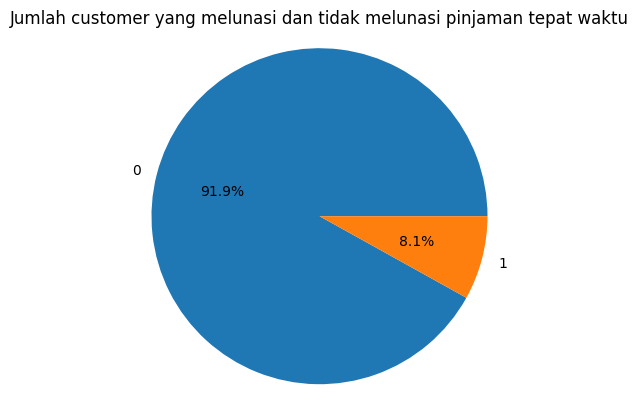

In [ ]:
#membuat pie chart variabel target
plt.pie(target_counts, labels=target_counts.index, autopct='%1.1f%%')
plt.axis('equal')
plt.title('Jumlah customer yang melunasi dan tidak melunasi pinjaman tepat waktu')
plt.show()

Berdasarkan pie chart diatas, dapat diketahui bahwa persentase klien yang melunasi pinjaman tepat waktu sebesar 91.9% sedangkan klien yang tidak elunasi pinjaman tepat waktu sebesar 8.1%

## Visualization Data Before Handling

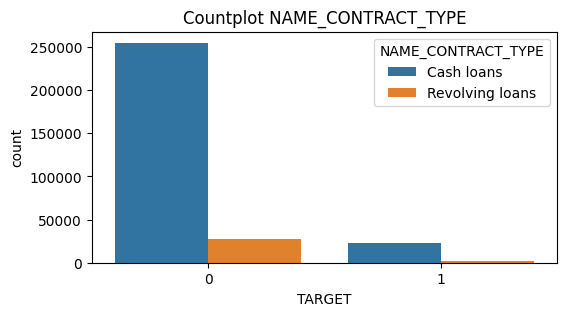

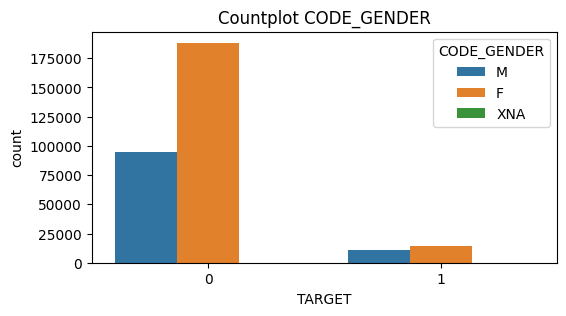

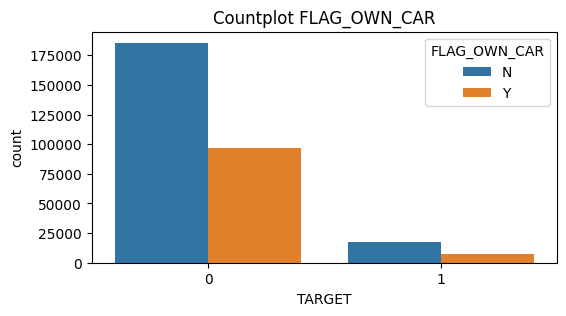

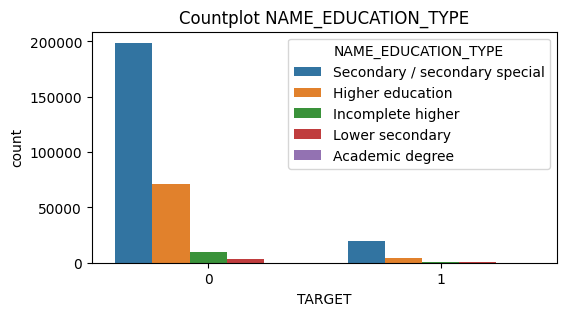

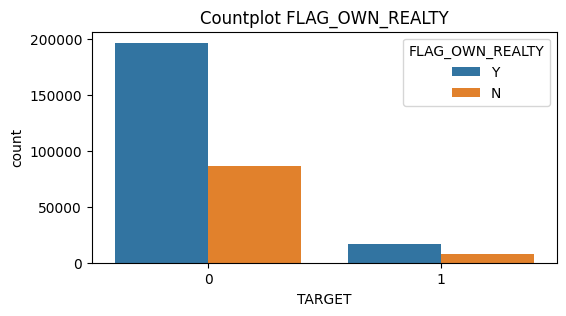

In [ ]:
var = df[['NAME_CONTRACT_TYPE','CODE_GENDER','FLAG_OWN_CAR','NAME_EDUCATION_TYPE','FLAG_OWN_REALTY']]

for var in var:
    plt.figure(figsize=(6,3))  # Membuat figure baru untuk setiap countplot
    sns.countplot(data=df, x=df['TARGET'], hue=var)
    plt.title(f"Countplot {var}")
    plt.show()

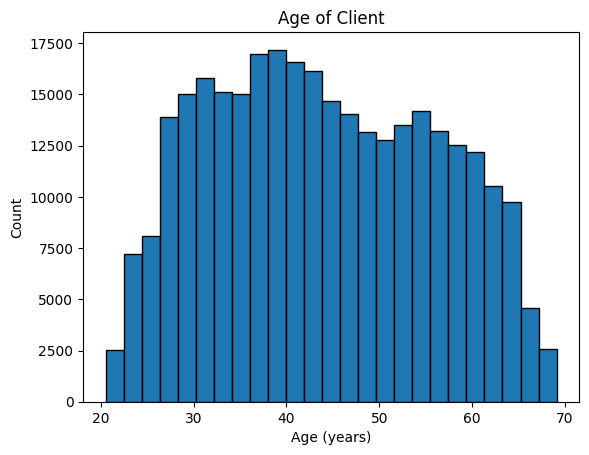

In [ ]:
# returns the absolute value of a number
df['DAYS_BIRTH'] = abs(df['DAYS_BIRTH'])
# hisplot the distribution of ages in years
plt.hist(df['DAYS_BIRTH'] / 365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

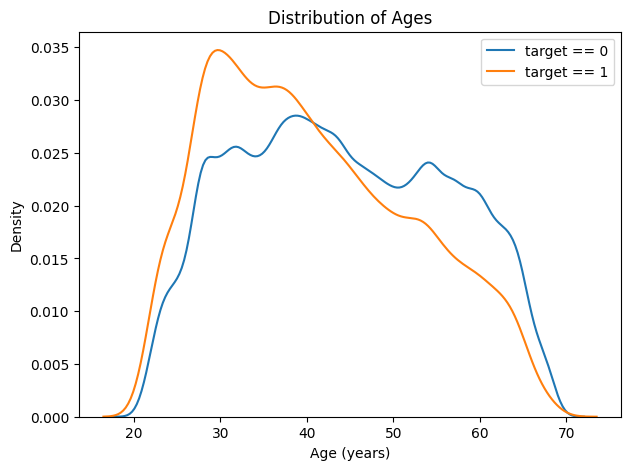

In [ ]:
plt.figure(figsize = (7, 5))
# KDE plot of loans that were repaid on time
sns.kdeplot(df.loc[df['TARGET'] == 0, 'DAYS_BIRTH'] / 365, label = 'target == 0')
# KDE plot of loans which were not repaid on time
sns.kdeplot(df.loc[df['TARGET'] == 1, 'DAYS_BIRTH'] / 365, label = 'target == 1')
# labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');
plt.legend(['target == 0','target == 1'], loc='best')

# **Data Preparation**

## Convert Data to Years

Pada beberapa kolom terdapat data yang berisi tentang keterangan jumlah hari namun masih bernilai negatif sehingga perlu diabsolut. Selain itu untuk mempersimple analisa keterangan jumlah hari akan di convert kedalam tahun

In [ ]:
df['DAYS_BIRTH'] = round((df['DAYS_BIRTH']/-365), 0).astype(int)
df['DAYS_EMPLOYED'] = df['DAYS_EMPLOYED'].values/-365
df['DAYS_REGISTRATION'] = df['DAYS_REGISTRATION'].values/-365
df['DAYS_ID_PUBLISH'] = df['DAYS_ID_PUBLISH'].values/-365
df['DAYS_LAST_PHONE_CHANGE'] = df['DAYS_LAST_PHONE_CHANGE'].values/-365

In [ ]:
df.rename(columns={'DAYS_BIRTH':'AGE','DAYS_EMPLOYED':'YEARS_EMPLOYED','DAYS_EMPLOYED':'YEARS_EMPLOYED','DAYS_REGISTRATION':'YEARS_REGISTRATION','DAYS_ID_PUBLISH':'YEARS_ID_PUBLISH','DAYS_LAST_PHONE_CHANGE':'YEARS_LAST_PHONE_CHANGE'}, inplace=True)

In [ ]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-26,1.745205,9.994521,5.808219,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-46,3.254795,3.249315,0.797260,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-52,0.616438,11.671233,6.934247,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

##Mengecek apakah ada unique yang tidak sesuai

In [ ]:


cats=[i for i in df.columns if df[i].dtype=='object']
nums=[i for i in df.columns if df[i].dtype!='object']


In [ ]:
#Mengetahui berapa unique pada kolom categorical dan jumlah masing-masing unique
for col in cats:
  print(df[col].value_counts())
  print()

Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64

Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64

Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAM

Dapat kita lihat terdapat unique yang tidak sesuai yaitu :

1. pada kolom ORGANIZATION _TYPE  yaitu unique XNA, other

2. pada kolom FONDKAPREMONT_MODE
yaitu not specified.

3. pada kolom WALLSMATERIAL_MODE yaitu others.

4. pada kolom CODE_GENDER yaitu XNA.

5. pada kolom NAME_FAMILY_STATUS yaitu unknownn.



Ketiga unique tersebut harus diganti dengan NaN

In [ ]:
df['NAME_FAMILY_STATUS']=df['NAME_FAMILY_STATUS'].replace(['Unknown'],np.nan)

In [ ]:
df['ORGANIZATION_TYPE']=df['ORGANIZATION_TYPE'].replace(['XNA','other'],np.nan)

In [ ]:
df['CODE_GENDER']=df['CODE_GENDER'].replace(['XNA'],np.nan)

In [ ]:
df['FONDKAPREMONT_MODE']=df['FONDKAPREMONT_MODE'].replace(['not specified'],np.nan)

In [ ]:
df['WALLSMATERIAL_MODE']=df['WALLSMATERIAL_MODE'].replace(['others'],np.nan)

## Missing Value Handling

In [ ]:
#menghapus kolom dengan jumlah null >50%
df.drop(columns=list(data_null['index'].loc[data_null['Persen'] >50]), inplace=True, axis=1)
df.shape

(307511, 82)

In [ ]:
#missing value handling
col_numeric = df.select_dtypes(exclude = ["object"] ).columns
for col in col_numeric :
  df[col] = df[col].fillna(df[col].median())


col_object = df.select_dtypes(include = ["object"]).columns
for col in col_object :
  df[col] = df[col].fillna(df[col].mode().iloc[0])

In [ ]:
#Check missing value setelah mengisi nilai missing value
null = df.isnull().sum().reset_index()
null_table = null.loc[null[0] > 0]
null_table.shape[0]

0

Dapat dilihat bahwa jumlah null dalam seluruh kolom di dataframe df adalah 0 sehingga dataframe df sudah tidak memiliki missing value.

##Outliers handling

In [ ]:
nums=[i for i in df.columns if df[i].dtype!='object' and i !='TARGET' and i!='SK_ID_CURR']
cats=[i for i in df.columns if df[i].dtype=='object']


In [ ]:
#Mengetahui statistik setiap kolom nums
#menggunakan transpose untuk mentranspose tabel dalam bentuk horizontal
df[nums].describe().T


,count,mean,std,min,25%,50%,75%,max
CNT_CHILDREN,307511.0,0.417052,0.722121,0.000000e+00,0.000000,0.000000,1.000000,1.900000e+01
AMT_INCOME_TOTAL,307511.0,168797.919297,237123.146279,2.565000e+04,112500.000000,147150.000000,202500.000000,1.170000e+08
AMT_CREDIT,307511.0,599025.999706,402490.776996,4.500000e+04,270000.000000,513531.000000,808650.000000,4.050000e+06
AMT_ANNUITY,307511.0,27108.487841,14493.461065,1.615500e+03,16524.000000,24903.000000,34596.000000,2.580255e+05
AMT_GOODS_PRICE,307511.0,538316.294367,369288.982246,4.050000e+04,238500.000000,450000.000000,679500.000000,4.050000e+06
REGION_POPULATION_RELATIVE,307511.0,0.020868,0.013831,2.900000e-04,0.010006,0.018850,0.028663,7.250800e-02
AGE,307511.0,-43.938646,11.964047,-6.900000e+01,-54.000000,-43.000000,-34.000000,-2.100000e+01
YEARS_EMPLOYED,307511.0,-174.835742,387.056895,-1.000666e+03,0.791781,3.323288,7.561644,4.907397e+01
YEARS_REGISTRATION,307511.0,13.660604,9.651743,-0.000000e+00,5.506849,12.339726,20.491781,6.759452e+01
YEARS_ID_PUBLISH,307511.0,8.203294,4.135481,-0.000000e+00,4.712329,8.915068,11.778082,1.971781e+01


Terlihat adanya outliers pada beberapa kolom dibuktikan dengan adanya nilai max dan min yang tidak wajar(anomalies) sehingga terbukti adanya outliers . Misalnya pada kolom years_employed dimana seharusnya tidak boleh bernilai negatif tetapi masih terdapat negatif value, adanya nilai max yang tidak wajar pada beberapa kolom seperti CNT_CHILDREN, AMT_CREDIT, AMT_ANNUITY_AMT_GOOD_PRICE, dsb.

##Outliers handling (AMT_CREDIT)

In [ ]:
#Dengan log transformation
df['log_AMT_CREDIT']=np.log(df['AMT_CREDIT']+1)

Text(0.5, 0, '')

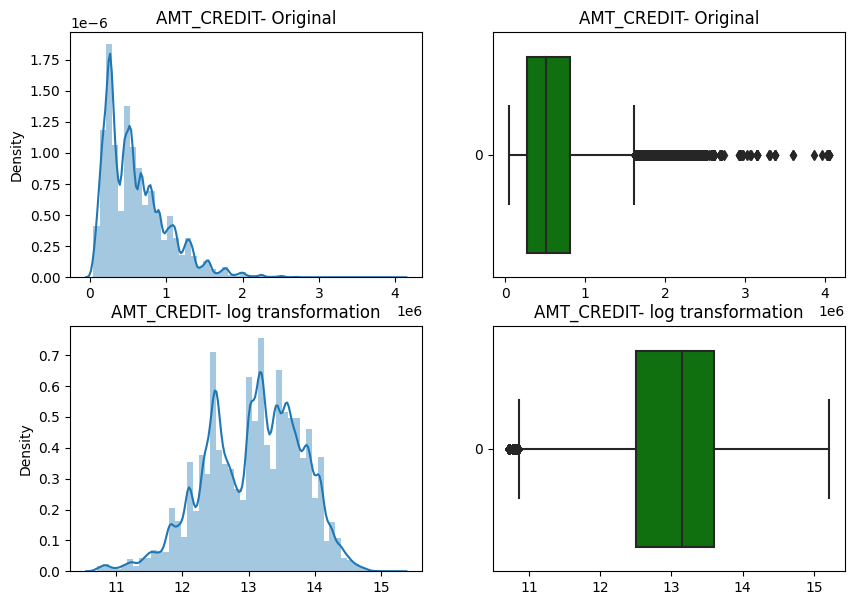

In [ ]:
f,ax=plt.subplots(2,2, figsize=(10,7))
g=sns.distplot(df['AMT_CREDIT'],kde=True, ax=ax[0,0])
ax[0,0].set_title('AMT_CREDIT- Original')
ax[0,0].set_xlabel('')
g=sns.boxplot(df['AMT_CREDIT'],color='green', orient='h', ax=ax[0,1])
ax[0,1].set_title('AMT_CREDIT- Original')
ax[0,1].set_xlabel('')
g=sns.distplot(np.log(df['AMT_CREDIT']+1),kde=True, ax=ax[1,0])
ax[1,0].set_title('AMT_CREDIT- log transformation')
ax[1,0].set_xlabel('')
g=sns.boxplot(np.log(df['AMT_CREDIT']+1),color='green',orient='h', ax=ax[1,1])
ax[1,1].set_title('AMT_CREDIT- log transformation')
ax[1,1].set_xlabel('')

In [ ]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,log_AMT_CREDIT
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,12.915581
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,14.072865
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,11.813037
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,12.652947
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,3.030137,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,13.148033


In [ ]:
# dengan  zcore
from scipy import stats

In [ ]:
df['AMT_CREDIT zscore']=abs(stats.zscore(df['AMT_CREDIT']))

In [ ]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,0.478095
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.725450
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.152888
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.711430
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,3.030137,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.213734


In [ ]:
#Memfilter baris dalam data frame sesudah handling outlier
print('Jumlah baris sebelum handling pada kolom AMT_CREDIT:', len(df))
Q1=df['AMT_CREDIT'].quantile(0.25)
Q3=df['AMT_CREDIT'].quantile(0.75)
IQR=Q3-Q1
low_limit=Q1-(1.5*IQR)
high_limit=Q3+(1.5*IQR)
filtered_entries=((df['AMT_CREDIT']>=low_limit)&(df['AMT_CREDIT']<=high_limit))
df=df[filtered_entries]
print(f'Jumlah baris setelah memfilter outlier :',len(df))
df.head()

Jumlah baris sebelum handling pada kolom AMT_CREDIT: 307511
Jumlah baris setelah memfilter outlier : 300949


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,0.478095
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.725450
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.152888
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.711430
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,3.030137,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.213734


#Outliers handling (Years_Employed)


Pada kolom years_employed terdapat negatif value dimana jumlah tahun tidak boleh bernilai negatif sehingga harus dihilangkan

In [ ]:
df = df.loc[(df['YEARS_EMPLOYED'] > 0)]
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,0.478095
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.725450
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.152888
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.711430
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,3.030137,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.213734


Mengecek apakah ada anomalies atau tidak yaitu dengan cara mengecek apakah ada orang yang lama tahun dipekerjakan > umur. Jika tidak ada maka tidak terdapat anomalies

In [ ]:
df.loc[(df["YEARS_EMPLOYED"] > (df["AGE"]) )]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore


Terbukti tidak ada anomalies

Tampilan boxplot setelah filtering

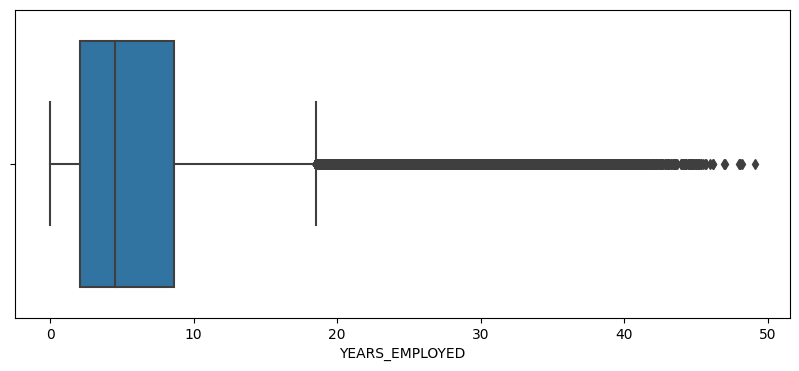

In [ ]:
fig = plt.figure(figsize=(10, 4))
ax = sns.boxplot(data = df, x = 'YEARS_EMPLOYED')
plt.show()

#Outlier Handling (Amount income total)

In [ ]:
# dengan  zcore

from scipy import stats

In [ ]:
df['AMT_INCOME_TOTAL zscore']=abs(stats.zscore(df['AMT_INCOME_TOTAL']))


In [ ]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,log_AMT_CREDIT,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,12.915581,0.478095,0.114246
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,14.072865,1.725450,0.374388
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,11.813037,1.152888,0.406038
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,12.652947,0.711430,0.145896
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,3.030137,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,13.148033,0.213734,0.197925


In [ ]:
#Memfilter baris dalam data frame sesudah handling outlier
print('Jumlah baris sebelum handling pada kolom AMT_INCOME_TOTAL:', len(df))
Q1=df['AMT_INCOME_TOTAL'].quantile(0.25)
Q3=df['AMT_INCOME_TOTAL'].quantile(0.75)
IQR=Q3-Q1
low_limit=Q1-(1.5*IQR)
high_limit=Q3+(1.5*IQR)
filtered_entries=((df['AMT_INCOME_TOTAL']>=low_limit)&(df['AMT_INCOME_TOTAL']<=high_limit))
df=df[filtered_entries]
print(f'Jumlah baris setelah memfilter outlier :',len(df))
df.head()

Jumlah baris sebelum handling pada kolom AMT_INCOME_TOTAL: 246390
Jumlah baris setelah memfilter outlier : 235103


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,0.478095,0.114246
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.725450,0.374388
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.152888,0.406038
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.711430,0.145896
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,3.030137,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.213734,0.197925


#Outlier Handling (CNT_CHILDREN)

In [ ]:
# dengan  zcore

from scipy import stats

In [ ]:
df['CNT_CHILDREN zscore']=abs(stats.zscore(df['CNT_CHILDREN']))


In [ ]:
#Memfilter baris dalam data frame sesudah handling outlier
print('Jumlah baris sebelum handling pada kolom :CNT_CHILDREN', len(df))
Q1=df['CNT_CHILDREN'].quantile(0.25)
Q3=df['CNT_CHILDREN'].quantile(0.75)
IQR=Q3-Q1
low_limit=Q1-(1.5*IQR)
high_limit=Q3+(1.5*IQR)
filtered_entries=((df['CNT_CHILDREN']>=low_limit)&(df['CNT_CHILDREN']<=high_limit))
df=df[filtered_entries]
print(f'Jumlah baris setelah memfilter outlier :',len(df))
df.head()

Jumlah baris sebelum handling pada kolom :CNT_CHILDREN 235103
Jumlah baris setelah memfilter outlier : 231258


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore,CNT_CHILDREN zscore
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,0.478095,0.114246,0.653256
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.725450,0.374388,0.653256
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.152888,0.406038,0.653256
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.711430,0.145896,0.653256
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,3.030137,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.213734,0.197925,0.653256


##Outlier Handling 'AMT_REQ_CREDIT_BUREAU_MON'

In [ ]:
# dengan  zcore

from scipy import stats

In [ ]:
df['AMT_REQ_CREDIT_BUREAU_MON zscore']=abs(stats.zscore(df['AMT_REQ_CREDIT_BUREAU_MON']))


In [ ]:
#Memfilter baris dalam data frame sesudah handling outlier
print('Jumlah baris sebelum handling pada kolom AMT_REQ_CREDIT_BUREAU_MON:', len(df))
Q1=df['AMT_REQ_CREDIT_BUREAU_MON'].quantile(0.25)
Q3=df['AMT_REQ_CREDIT_BUREAU_MON'].quantile(0.75)
IQR=Q3-Q1
low_limit=Q1-(1.5*IQR)
high_limit=Q3+(1.5*IQR)
filtered_entries=((df['AMT_REQ_CREDIT_BUREAU_MON']>=low_limit)&(df['AMT_REQ_CREDIT_BUREAU_MON']<=high_limit))
df=df[filtered_entries]
print(f'Jumlah baris setelah memfilter outlier :',len(df))
df.head()

Jumlah baris sebelum handling pada kolom AMT_REQ_CREDIT_BUREAU_MON: 231258
Jumlah baris setelah memfilter outlier : 197996


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore,CNT_CHILDREN zscore,AMT_REQ_CREDIT_BUREAU_MON zscore
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,0.478095,0.114246,0.653256,0.272466
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.725450,0.374388,0.653256,0.272466
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.152888,0.406038,0.653256,0.272466
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.711430,0.145896,0.653256,0.272466
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,3.030137,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.213734,0.197925,0.653256,0.272466


##Outliers handling (YEARS_REGISTRATION)

In [ ]:
# dengan  zcore

from scipy import stats

In [ ]:
df['YEARS_REGISTRATION zscore']=abs(stats.zscore(df['YEARS_REGISTRATION']))


In [ ]:
#Memfilter baris dalam data frame sesudah handling outlier
print('Jumlah baris sebelum handling pada kolom :YEARS_REGISTRATION', len(df))
Q1=df['YEARS_REGISTRATION'].quantile(0.25)
Q3=df['YEARS_REGISTRATION'].quantile(0.75)
IQR=Q3-Q1
low_limit=Q1-(1.5*IQR)
high_limit=Q3+(1.5*IQR)
filtered_entries=((df['YEARS_REGISTRATION']>=low_limit)&(df['YEARS_REGISTRATION']<=high_limit))
df=df[filtered_entries]
print(f'Jumlah baris setelah memfilter outlier :',len(df))
df.head()

Jumlah baris sebelum handling pada kolom :YEARS_REGISTRATION 197996
Jumlah baris setelah memfilter outlier : 197548


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore,CNT_CHILDREN zscore,AMT_REQ_CREDIT_BUREAU_MON zscore,YEARS_REGISTRATION zscore
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,0.478095,0.114246,0.653256,0.272466,0.311834
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.725450,0.374388,0.653256,0.272466,1.068854
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.152888,0.406038,0.653256,0.272466,0.123655
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.711430,0.145896,0.653256,0.272466,1.589942
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,3.030137,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.213734,0.197925,0.653256,0.272466,0.107973


##Outliers handling (SOCIAL CIRCLE)

In [ ]:
# dengan  zcore

from scipy import stats

In [ ]:
df['OBS_30_CNT_SOCIAL_CIRCLE zscore']=abs(stats.zscore(df['OBS_30_CNT_SOCIAL_CIRCLE']))


In [ ]:
#Memfilter baris dalam data frame sesudah handling outlier
print('Jumlah baris sebelum handling pada kolom :OBS_30_CNT_SOCIAL_CIRCLE', len(df))
Q1=df['OBS_30_CNT_SOCIAL_CIRCLE'].quantile(0.25)
Q3=df['OBS_30_CNT_SOCIAL_CIRCLE'].quantile(0.75)
IQR=Q3-Q1
low_limit=Q1-(1.5*IQR)
high_limit=Q3+(1.5*IQR)
filtered_entries=((df['OBS_30_CNT_SOCIAL_CIRCLE']>=low_limit)&(df['OBS_30_CNT_SOCIAL_CIRCLE']<=high_limit))
df=df[filtered_entries]
print(f'Jumlah baris setelah memfilter outlier :',len(df))
df.head()

Jumlah baris sebelum handling pada kolom :OBS_30_CNT_SOCIAL_CIRCLE 197548
Jumlah baris setelah memfilter outlier : 184805


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore,CNT_CHILDREN zscore,AMT_REQ_CREDIT_BUREAU_MON zscore,YEARS_REGISTRATION zscore,OBS_30_CNT_SOCIAL_CIRCLE zscore
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,0.478095,0.114246,0.653256,0.272466,0.311834,0.251375
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.725450,0.374388,0.653256,0.272466,1.068854,0.182313
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.152888,0.406038,0.653256,0.272466,0.123655,0.616001
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.711430,0.145896,0.653256,0.272466,1.589942,0.251375
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,3.030137,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,

##Outliers handling (AMT_ANNUITY)

In [ ]:
# dengan  zcore

from scipy import stats

In [ ]:
df['AMT_ANNUITY zscore']=abs(stats.zscore(df['AMT_ANNUITY']))


In [ ]:
#Memfilter baris dalam data frame sesudah handling outlier
print('Jumlah baris sebelum handling pada kolom :AMT_ANNUITY', len(df))
Q1=df['AMT_ANNUITY'].quantile(0.25)
Q3=df['AMT_ANNUITY'].quantile(0.75)
IQR=Q3-Q1
low_limit=Q1-(1.5*IQR)
high_limit=Q3+(1.5*IQR)
filtered_entries=((df['AMT_ANNUITY']>=low_limit)&(df['AMT_ANNUITY']<=high_limit))
df=df[filtered_entries]
print(f'Jumlah baris setelah memfilter outlier :',len(df))
df.head()

Jumlah baris sebelum handling pada kolom :AMT_ANNUITY 184805
Jumlah baris setelah memfilter outlier : 181761


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore,CNT_CHILDREN zscore,AMT_REQ_CREDIT_BUREAU_MON zscore,YEARS_REGISTRATION zscore,OBS_30_CNT_SOCIAL_CIRCLE zscore,AMT_ANNUITY zscore
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,0.478095,0.114246,0.653256,0.272466,0.311834,0.251375,0.112941
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.725450,0.374388,0.653256,0.272466,1.068854,0.182313,0.740919
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.152888,0.406038,0.653256,0.272466,0.123655,0.616001,1.506577
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.711430,0.145896,0.653256,0.272466,1.589942,0.251375,0.274161
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,3.030137,0,0,0,0,0,0,1

##Outliers handling (AMT_GOODS_PRICE)

In [ ]:
# dengan  zcore

from scipy import stats

In [ ]:
df['AMT_GOODS_PRICE zscore']=abs(stats.zscore(df['AMT_GOODS_PRICE']))


In [ ]:
#Memfilter baris dalam data frame sesudah handling outlier
print('Jumlah baris sebelum handling pada kolom :AMT_GOODS_PRICE', len(df))
Q1=df['AMT_GOODS_PRICE'].quantile(0.25)
Q3=df['AMT_GOODS_PRICE'].quantile(0.75)
IQR=Q3-Q1
low_limit=Q1-(1.5*IQR)
high_limit=Q3+(1.5*IQR)
filtered_entries=((df['AMT_GOODS_PRICE']>=low_limit)&(df['AMT_GOODS_PRICE']<=high_limit))
df=df[filtered_entries]
print(f'Jumlah baris setelah memfilter outlier :',len(df))
df.head()

Jumlah baris sebelum handling pada kolom :AMT_GOODS_PRICE 181761
Jumlah baris setelah memfilter outlier : 178066


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore,CNT_CHILDREN zscore,AMT_REQ_CREDIT_BUREAU_MON zscore,YEARS_REGISTRATION zscore,OBS_30_CNT_SOCIAL_CIRCLE zscore,AMT_ANNUITY zscore,AMT_GOODS_PRICE zscore
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,0.478095,0.114246,0.653256,0.272466,0.311834,0.251375,0.112941,0.465991
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.725450,0.374388,0.653256,0.272466,1.068854,0.182313,0.740919,2.048915
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.152888,0.406038,0.653256,0.272466,0.123655,0.616001,1.506577,1.163768
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.711430,0.145896,0.653256,0.272466,1.589942,0.251375,0.274161,0.640435
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9

##Outlier Handling AMT_REQ_CREDIT_BUREAU_WEEK

In [ ]:
# dengan  zcore

from scipy import stats

In [ ]:
df['AMT_REQ_CREDIT_BUREAU_WEEK zscore']=abs(stats.zscore(df['AMT_REQ_CREDIT_BUREAU_WEEK']))


In [ ]:
#Memfilter baris dalam data frame sesudah handling outlier
print('Jumlah baris sebelum handling pada kolom AMT_REQ_CREDIT_BUREAU_WEEK:', len(df))
Q1=df['AMT_REQ_CREDIT_BUREAU_WEEK'].quantile(0.25)
Q3=df['AMT_REQ_CREDIT_BUREAU_WEEK'].quantile(0.75)
IQR=Q3-Q1
low_limit=Q1-(1.5*IQR)
high_limit=Q3+(1.5*IQR)
filtered_entries=((df['AMT_REQ_CREDIT_BUREAU_WEEK']>=low_limit)&(df['AMT_REQ_CREDIT_BUREAU_WEEK']<=high_limit))
df=df[filtered_entries]
print(f'Jumlah baris setelah memfilter outlier :',len(df))
df.head()

Jumlah baris sebelum handling pada kolom AMT_REQ_CREDIT_BUREAU_WEEK: 178066
Jumlah baris setelah memfilter outlier : 173036


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore,CNT_CHILDREN zscore,AMT_REQ_CREDIT_BUREAU_MON zscore,YEARS_REGISTRATION zscore,OBS_30_CNT_SOCIAL_CIRCLE zscore,AMT_ANNUITY zscore,AMT_GOODS_PRICE zscore,AMT_REQ_CREDIT_BUREAU_WEEK zscore
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,0.478095,0.114246,0.653256,0.272466,0.311834,0.251375,0.112941,0.465991,0.158662
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.725450,0.374388,0.653256,0.272466,1.068854,0.182313,0.740919,2.048915,0.158662
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.152888,0.406038,0.653256,0.272466,0.123655,0.616001,1.506577,1.163768,0.158662
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.711430,0.145896,0.653256,0.272466,1.589942,0.251375,0.274161,0.640435,0.158662
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,

##Outlier Handling 'AMT_REQ_CREDIT_BUREAU_DAY'

In [ ]:
# dengan  zcore

from scipy import stats

In [ ]:
df['AMT_REQ_CREDIT_BUREAU_DAY']=abs(stats.zscore(df['AMT_REQ_CREDIT_BUREAU_DAY']))


In [ ]:
#Memfilter baris dalam data frame sesudah handling outlier
print('Jumlah baris sebelum handling pada kolom AMT_REQ_CREDIT_BUREAU_DAY:', len(df))
Q1=df['AMT_REQ_CREDIT_BUREAU_DAY'].quantile(0.25)
Q3=df['AMT_REQ_CREDIT_BUREAU_DAY'].quantile(0.75)
IQR=Q3-Q1
low_limit=Q1-(1.5*IQR)
high_limit=Q3+(1.5*IQR)
filtered_entries=((df['AMT_REQ_CREDIT_BUREAU_DAY']>=low_limit)&(df['AMT_REQ_CREDIT_BUREAU_DAY']<=high_limit))
df=df[filtered_entries]
print(f'Jumlah baris setelah memfilter outlier :',len(df))
df.head()

Jumlah baris sebelum handling pada kolom AMT_REQ_CREDIT_BUREAU_DAY: 173036
Jumlah baris setelah memfilter outlier : 172300


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore,CNT_CHILDREN zscore,AMT_REQ_CREDIT_BUREAU_MON zscore,YEARS_REGISTRATION zscore,OBS_30_CNT_SOCIAL_CIRCLE zscore,AMT_ANNUITY zscore,AMT_GOODS_PRICE zscore,AMT_REQ_CREDIT_BUREAU_WEEK zscore
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.059696,0.0,0.0,0.0,1.0,8.0,0.478095,0.114246,0.653256,0.272466,0.311834,0.251375,0.112941,0.465991,0.158662
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.059696,0.0,0.0,0.0,0.0,4.0,1.725450,0.374388,0.653256,0.272466,1.068854,0.182313,0.740919,2.048915,0.158662
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.059696,0.0,0.0,0.0,0.0,2.0,1.152888,0.406038,0.653256,0.272466,0.123655,0.616001,1.506577,1.163768,0.158662
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.059696,0.0,0.0,0.0,1.0,4.0,0.711430,0.145896,0.653256,0.272466,1.589942,0.251375,0.274161,0.640435,0.158662
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,

##Outlier Handling AMT_REQ_CREDIT_BUREAU_HOUR

In [ ]:
# dengan  zcore

from scipy import stats

In [ ]:
df['AMT_REQ_CREDIT_BUREAU_HOUR']=abs(stats.zscore(df['AMT_REQ_CREDIT_BUREAU_HOUR']))


In [ ]:
#Memfilter baris dalam data frame sesudah handling outlier
print('Jumlah baris sebelum handling pada kolom AMT_REQ_CREDIT_BUREAU_HOUR:', len(df))
Q1=df['AMT_REQ_CREDIT_BUREAU_HOUR'].quantile(0.25)
Q3=df['AMT_REQ_CREDIT_BUREAU_HOUR'].quantile(0.75)
IQR=Q3-Q1
low_limit=Q1-(1.5*IQR)
high_limit=Q3+(1.5*IQR)
filtered_entries=((df['AMT_REQ_CREDIT_BUREAU_HOUR']>=low_limit)&(df['AMT_REQ_CREDIT_BUREAU_HOUR']<=high_limit))
df=df[filtered_entries]
print(f'Jumlah baris setelah memfilter outlier :',len(df))
df.head()

Jumlah baris sebelum handling pada kolom AMT_REQ_CREDIT_BUREAU_HOUR: 172300
Jumlah baris setelah memfilter outlier : 171593


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore,CNT_CHILDREN zscore,AMT_REQ_CREDIT_BUREAU_MON zscore,YEARS_REGISTRATION zscore,OBS_30_CNT_SOCIAL_CIRCLE zscore,AMT_ANNUITY zscore,AMT_GOODS_PRICE zscore,AMT_REQ_CREDIT_BUREAU_WEEK zscore
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,26,1.745205,9.994521,5.808219,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,3.106849,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,1.0,8.0,0.478095,0.114246,0.653256,0.272466,0.311834,0.251375,0.112941,0.465991,0.158662
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,0.0,4.0,1.725450,0.374388,0.653256,0.272466,1.068854,0.182313,0.740919,2.048915,0.158662
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.0,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,0.0,2.0,1.152888,0.406038,0.653256,0.272466,0.123655,0.616001,1.506577,1.163768,0.158662
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.0,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,1.0,4.0,0.711430,0.145896,0.653256,0.272466,1.589942,0.251375,0.274161,0.640435,0.158662
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1

##Outlier Handling'DEF_30_CNT_SOCIAL_CIRCLE'

In [ ]:
# dengan  zcore

from scipy import stats

In [ ]:
df['DEF_30_CNT_SOCIAL_CIRCLE']=abs(stats.zscore(df['DEF_30_CNT_SOCIAL_CIRCLE']))


In [ ]:
#Memfilter baris dalam data frame sesudah handling outlier
print('Jumlah baris sebelum handling pada kolom :DEF_30_CNT_SOCIAL_CIRCLE', len(df))
Q1=df['DEF_30_CNT_SOCIAL_CIRCLE'].quantile(0.25)
Q3=df['DEF_30_CNT_SOCIAL_CIRCLE'].quantile(0.75)
IQR=Q3-Q1
low_limit=Q1-(1.5*IQR)
high_limit=Q3+(1.5*IQR)
filtered_entries=((df['DEF_30_CNT_SOCIAL_CIRCLE']>=low_limit)&(df['DEF_30_CNT_SOCIAL_CIRCLE']<=high_limit))
df=df[filtered_entries]
print(f'Jumlah baris setelah memfilter outlier :',len(df))
df.head()

Jumlah baris sebelum handling pada kolom :DEF_30_CNT_SOCIAL_CIRCLE 171593
Jumlah baris setelah memfilter outlier : 153607


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore,CNT_CHILDREN zscore,AMT_REQ_CREDIT_BUREAU_MON zscore,YEARS_REGISTRATION zscore,OBS_30_CNT_SOCIAL_CIRCLE zscore,AMT_ANNUITY zscore,AMT_GOODS_PRICE zscore,AMT_REQ_CREDIT_BUREAU_WEEK zscore
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.316456,1.0,0.0,2.268493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,0.0,4.0,1.725450,0.374388,0.653256,0.272466,1.068854,0.182313,0.740919,2.048915,0.158662
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.316456,0.0,0.0,2.232877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,0.0,2.0,1.152888,0.406038,0.653256,0.272466,0.123655,0.616001,1.506577,1.163768,0.158662
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.316456,2.0,0.0,1.690411,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,1.0,4.0,0.711430,0.145896,0.653256,0.272466,1.589942,0.251375,0.274161,0.640435,0.158662
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.316456,0.0,0.0,3.030137,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,0.0,1.0,0.213734,0.197925,0.653256,0.272466,0.107973,0.616001,0.333044,0.057342,0.158662
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,46,4.350685,13.616438,1.306849

##Outlier Handling 'YEARS_LAST_PHONE_CHANGE'

In [ ]:
# dengan  zcore

from scipy import stats

In [ ]:
df['YEARS_LAST_PHONE_CHANGE']=abs(stats.zscore(df['YEARS_LAST_PHONE_CHANGE']))


In [ ]:
#Memfilter baris dalam data frame sesudah handling outlier
print('Jumlah baris sebelum handling pada kolom :YEARS_LAST_PHONE_CHANGE', len(df))
Q1=df['YEARS_LAST_PHONE_CHANGE'].quantile(0.25)
Q3=df['YEARS_LAST_PHONE_CHANGE'].quantile(0.75)
IQR=Q3-Q1
low_limit=Q1-(1.5*IQR)
high_limit=Q3+(1.5*IQR)
filtered_entries=((df['YEARS_LAST_PHONE_CHANGE']>=low_limit)&(df['YEARS_LAST_PHONE_CHANGE']<=high_limit))
df=df[filtered_entries]
print(f'Jumlah baris setelah memfilter outlier :',len(df))
df.head()

Jumlah baris sebelum handling pada kolom :YEARS_LAST_PHONE_CHANGE 153607
Jumlah baris setelah memfilter outlier : 149708


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore,CNT_CHILDREN zscore,AMT_REQ_CREDIT_BUREAU_MON zscore,YEARS_REGISTRATION zscore,OBS_30_CNT_SOCIAL_CIRCLE zscore,AMT_ANNUITY zscore,AMT_GOODS_PRICE zscore,AMT_REQ_CREDIT_BUREAU_WEEK zscore
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,46,3.254795,3.249315,0.797260,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.316456,1.0,0.0,0.139595,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,0.0,4.0,1.725450,0.374388,0.653256,0.272466,1.068854,0.182313,0.740919,2.048915,0.158662
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52,0.616438,11.671233,6.934247,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.316456,0.0,0.0,0.155525,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,0.0,2.0,1.152888,0.406038,0.653256,0.272466,0.123655,0.616001,1.506577,1.163768,0.158662
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52,8.326027,26.939726,6.676712,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.316456,2.0,0.0,0.398148,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,1.0,4.0,0.711430,0.145896,0.653256,0.272466,1.589942,0.251375,0.274161,0.640435,0.158662
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,55,8.323288,11.810959,9.473973,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.316456,0.0,0.0,0.201059,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,0.0,1.0,0.213734,0.197925,0.653256,0.272466,0.107973,0.616001,0.333044,0.057342,0.158662
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,46,4.350685,13.616438,1.306849

##EXPLORATORY DATA ANALYSIS

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 149708 entries, 1 to 307509
Data columns (total 91 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   SK_ID_CURR                         149708 non-null  int64  
 1   TARGET                             149708 non-null  int64  
 2   NAME_CONTRACT_TYPE                 149708 non-null  object 
 3   CODE_GENDER                        149708 non-null  object 
 4   FLAG_OWN_CAR                       149708 non-null  object 
 5   FLAG_OWN_REALTY                    149708 non-null  object 
 6   CNT_CHILDREN                       149708 non-null  int64  
 7   AMT_INCOME_TOTAL                   149708 non-null  float64
 8   AMT_CREDIT                         149708 non-null  float64
 9   AMT_ANNUITY                        149708 non-null  float64
 10  AMT_GOODS_PRICE                    149708 non-null  float64
 11  NAME_TYPE_SUITE                    1497

##UNIVARIATE ANALYSIS

Jumlah customer yang tidak melunasi pinjaman tepat waktu:  13296 , ( 8.881288909076336 %)
Jumlah customer yang melunasi pinjaman tepat waktu:  136412 , ( 91.11871109092367 %)


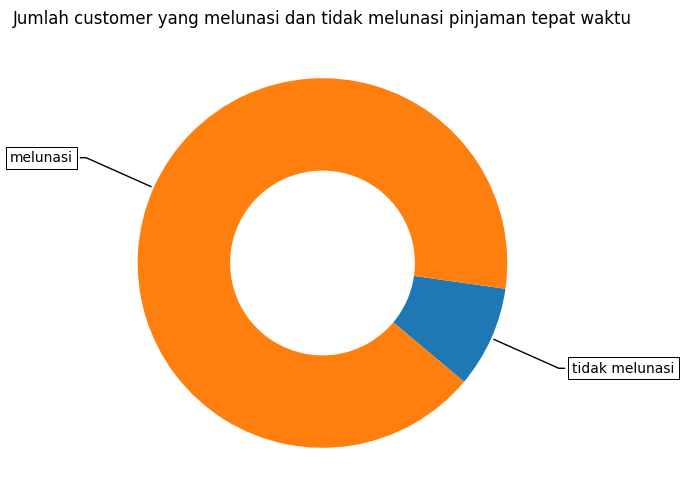

In [ ]:
#mengetahui distribusi dari kolom TARGET
y_value_counts = df['TARGET'].value_counts()
print("Jumlah customer yang tidak melunasi pinjaman tepat waktu: ", y_value_counts[1], ", (", (y_value_counts[1]/(y_value_counts[1]+y_value_counts[0]))*100,"%)")
print("Jumlah customer yang melunasi pinjaman tepat waktu: ", y_value_counts[0], ", (", (y_value_counts[0]/(y_value_counts[1]+y_value_counts[0]))*100,"%)")

fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(aspect="equal"))
recipe = ["tidak melunasi", "melunasi"]

data = [y_value_counts[1], y_value_counts[0]]

wedges, texts = ax.pie(data, wedgeprops=dict(width=0.5),\
                       startangle=-40)

bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(xycoords='data', textcoords='data', arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate(recipe[i], xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
                 horizontalalignment=horizontalalignment, **kw)

ax.set_title("Jumlah customer yang melunasi dan tidak melunasi pinjaman tepat waktu")

plt.show()

In [ ]:
nums

['CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'AGE',
 'YEARS_EMPLOYED',
 'YEARS_REGISTRATION',
 'YEARS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'YEARS_BEGINEXPLUATATION_AVG',
 'FLOORSMAX_AVG',
 'YEARS_BEGINEXPLUATATION_MODE',
 'FLOORSMAX_MODE',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'FLOORSMAX_MEDI',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'YEARS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUM

Membuat Boxplot dari Kolom nums

In [ ]:
#parameter yang hanya berisi data numerical pt.1
int_features = df[["CNT_CHILDREN", "AMT_INCOME_TOTAL", "AMT_CREDIT", "AMT_ANNUITY", "AMT_GOODS_PRICE"]]

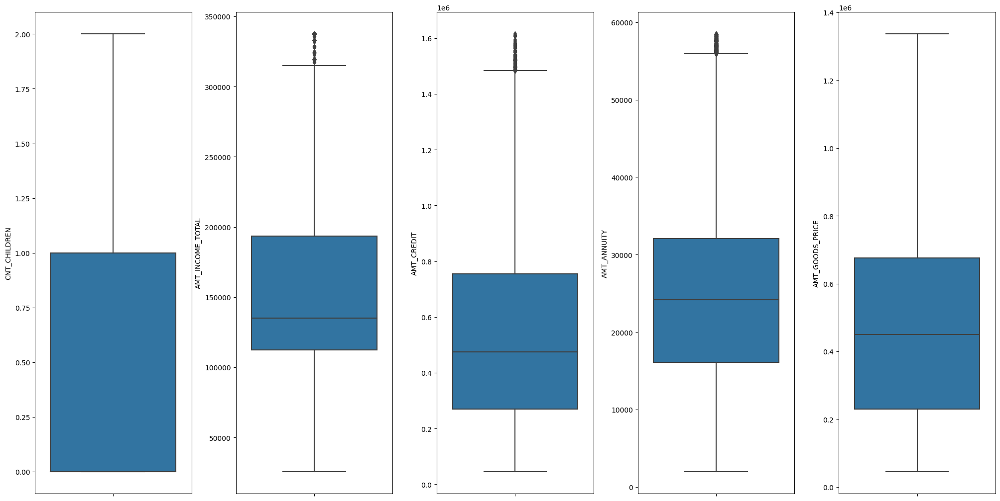

In [ ]:
fig, axs = plt.subplots(ncols=5, nrows=1, figsize=(20, 10))
index = 0
axs = axs.flatten()
for k,v in int_features.items():
    sns.boxplot(y = k, data = int_features, ax=axs[index])
    index += 1
    if index == 5:
      break;
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

In [ ]:
#parameter yang hanya berisi data numerical pt.2
int_features2 = df[["AGE", "YEARS_EMPLOYED", "YEARS_REGISTRATION", "YEARS_ID_PUBLISH", "CNT_FAM_MEMBERS"]]

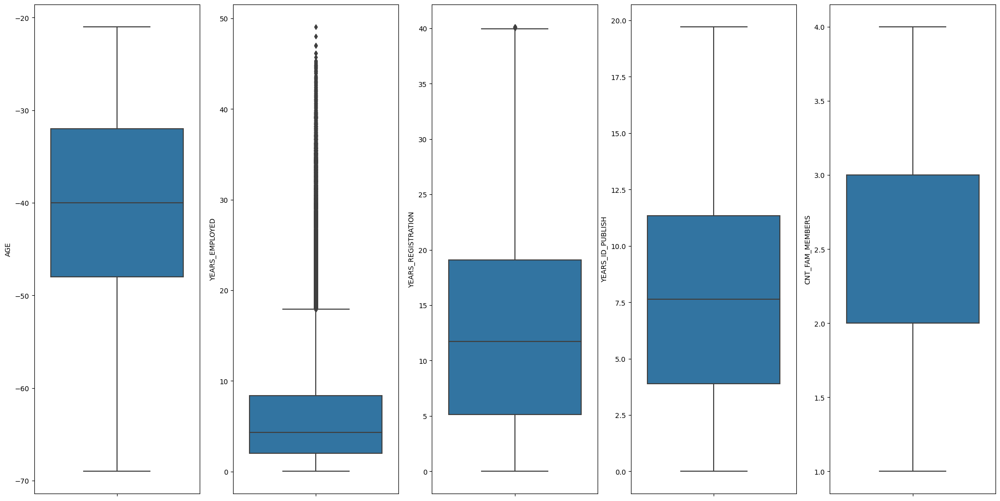

In [ ]:
fig, axs = plt.subplots(ncols=5, nrows=1, figsize=(20, 10))
index = 0
axs = axs.flatten()
for i,j in int_features2.items():
    sns.boxplot(y = i, data = int_features2, ax=axs[index])
    index += 1
    if index == 5:
      break;
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

In [ ]:
#parameter yang hanya berisi data numerical pt.3
int_features3 = df[["AMT_REQ_CREDIT_BUREAU_YEAR", "AMT_REQ_CREDIT_BUREAU_MON", "AMT_REQ_CREDIT_BUREAU_WEEK", "AMT_REQ_CREDIT_BUREAU_DAY", "AMT_REQ_CREDIT_BUREAU_HOUR"]]

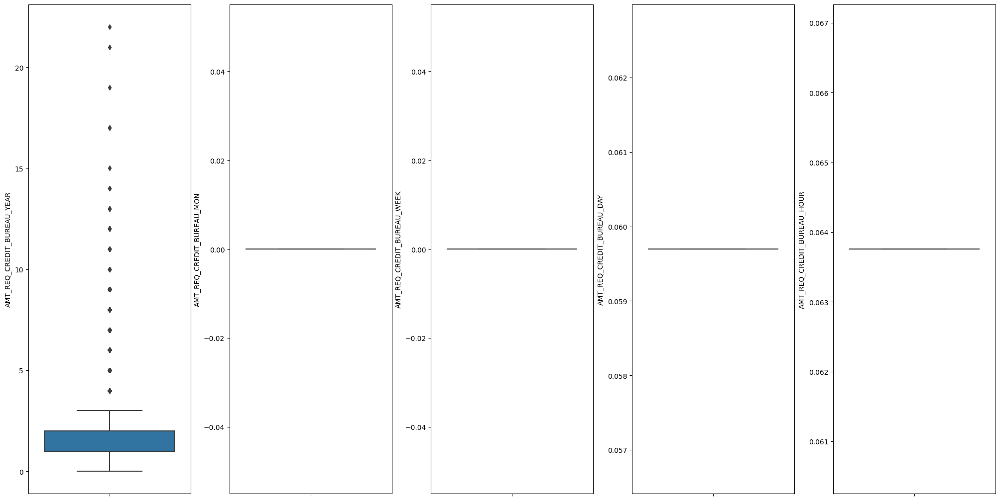

In [ ]:
fig, axs = plt.subplots(ncols=5, nrows=1, figsize=(20, 10))
index = 0
axs = axs.flatten()
for i,j in int_features3.items():
    sns.boxplot(y = i, data = int_features3, ax=axs[index])
    index += 1
    if index == 5:
      break;
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

In [ ]:
#parameter yang hanya berisi data numerical pt.4
int_features4 = df[["OBS_30_CNT_SOCIAL_CIRCLE", "OBS_60_CNT_SOCIAL_CIRCLE", "DEF_30_CNT_SOCIAL_CIRCLE", "DEF_60_CNT_SOCIAL_CIRCLE", "REGION_POPULATION_RELATIVE"]]

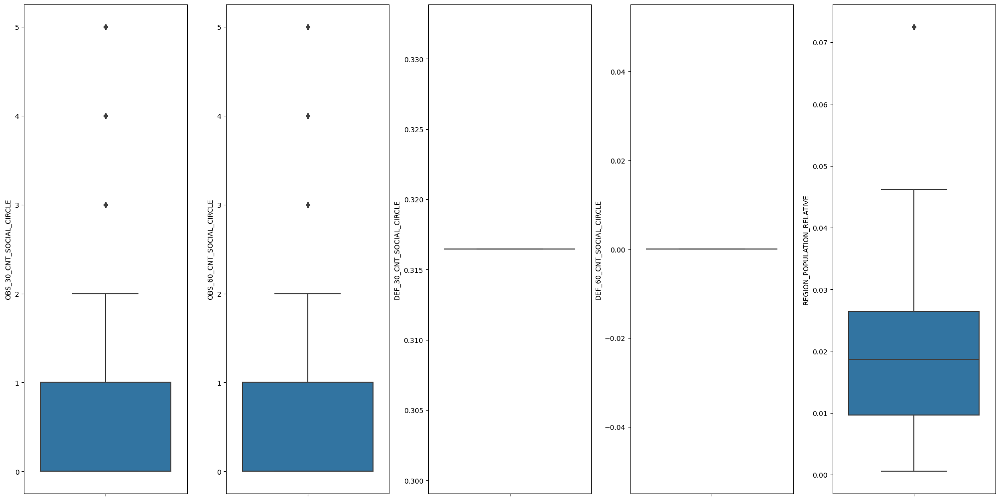

In [ ]:
fig, axs = plt.subplots(ncols=5, nrows=1, figsize=(20, 10))
index = 0
axs = axs.flatten()
for i,j in int_features4.items():
    sns.boxplot(y = i, data = int_features4, ax=axs[index])
    index += 1
    if index == 5:
      break;
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

In [ ]:
#parameter yang hanya berisi data numerical pt.5
int_features5 = df[["REGION_RATING_CLIENT", "HOUR_APPR_PROCESS_START", "YEARS_LAST_PHONE_CHANGE", "FLAG_DOCUMENT_2", "AMT_REQ_CREDIT_BUREAU_QRT"]]

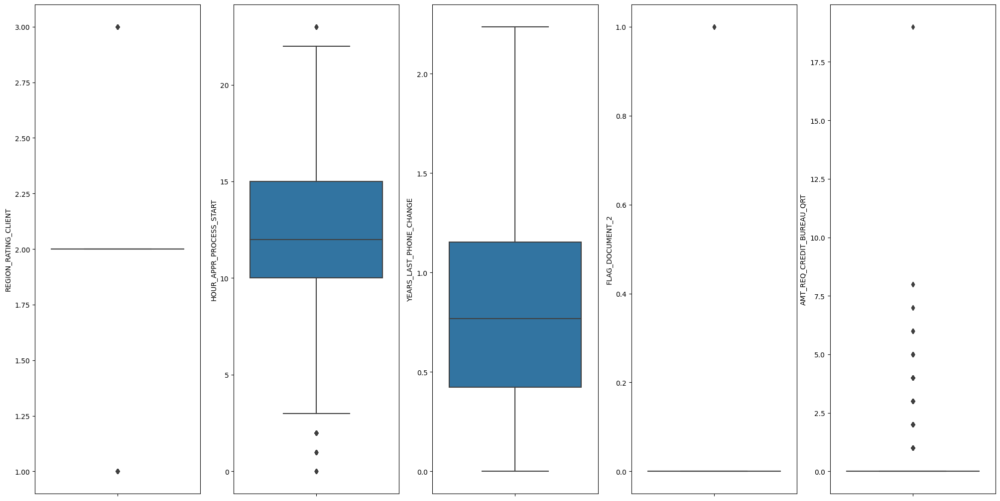

In [ ]:
fig, axs = plt.subplots(ncols=5, nrows=1, figsize=(20, 10))
index = 0
axs = axs.flatten()
for i,j in int_features5.items():
    sns.boxplot(y = i, data = int_features5, ax=axs[index])
    index += 1
    if index == 5:
      break;
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

Karena sudah dilakukan outlier handling, maka terlihat persebaran bosplot lebih merata dan hanya sedikit terdapat outlier.

##COUNTPLOT

In [ ]:
df[cats].head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,EMERGENCYSTATE_MODE
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,No
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,No
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,No
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,No
5,Cash loans,M,N,Y,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,Laborers,WEDNESDAY,Other,No


In [ ]:
len(cats)

13

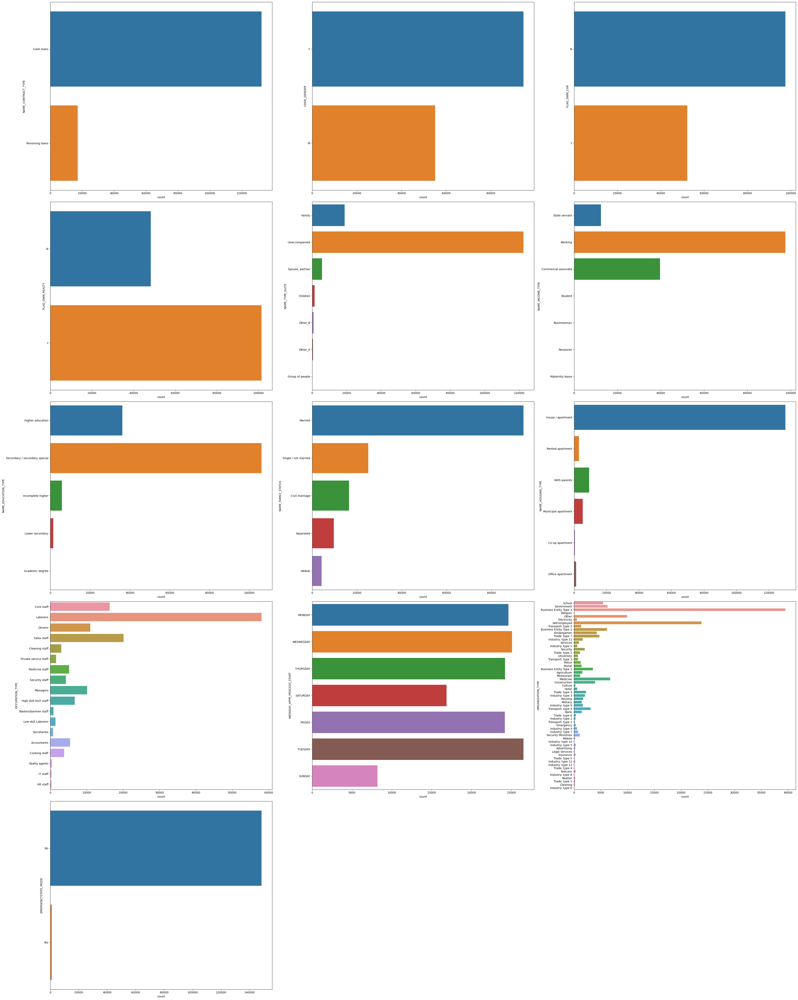

In [ ]:
#Membuat countplot dengan loop dari 0 sampai banyaknya kolom cats
#karena banyaknya kolom cats ada 16 maka dibuat plt.subplot(5,3,i+1) artinya terdapat 4 baris dengan tiap baris ada 3 gambar dengan index i+1
plt.figure(figsize=(40,50))
for i in range(0,len(cats)):
  plt.subplot(5,3,i+1)
  sns.countplot(y=df[cats[i]],orient='v')
plt.tight_layout()

Dengan countplot tersebut kita dapat mengetahui top unique dari masing-masing kolom

##Bivariate Analysis Nums terhadap Target

#AGE VS TARGET

In [ ]:
# Menampilkan deskripsi data AGE
df['AGE'].describe()

count    149708.000000
mean         40.157280
std          10.160427
min          21.000000
25%          32.000000
50%          40.000000
75%          48.000000
max          69.000000
Name: AGE, dtype: float64

In [ ]:
# Membuat kelompok umur dari peminjam
grup_age = df[['TARGET', 'AGE']]
grup_age['AGE_GROUP'] = pd.cut(grup_age['AGE'], bins = np.linspace(20, 70, num=6))

# Menampilkan rata-rata target dan age berdasarkan kelompok umur
grup_age = (grup_age.groupby(['AGE_GROUP']).mean()).sort_values('TARGET')
grup_age

,TARGET,AGE
AGE_GROUP,,
"(60.0, 70.0]",0.046392,63.231271
"(50.0, 60.0]",0.067397,54.386821
"(40.0, 50.0]",0.076550,45.259263
"(30.0, 40.0]",0.098156,35.581955
"(20.0, 30.0]",0.112334,26.734718


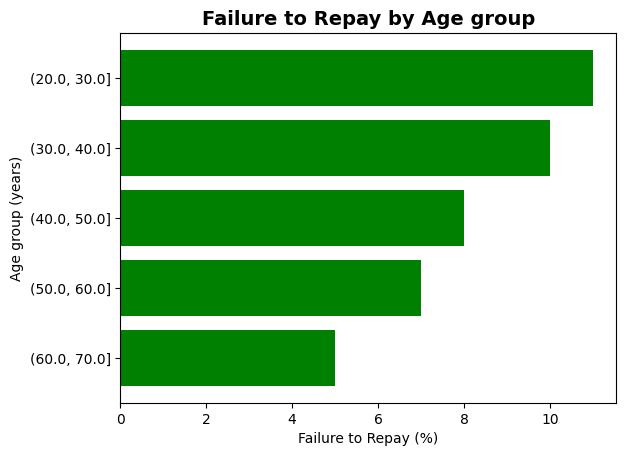

In [ ]:
# Tingkat gagal bayar dari setiap kelompok umur
plt.barh(grup_age.index.astype(str), round(100*grup_age['TARGET']), color='green')
plt.ylabel('Age group (years)')
plt.xlabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age group', fontsize=14, weight="bold");
plt.show()

Dapat dilihat bahwa customer yang berusia 20-30 tahun memiliki tingkat persentase gagal bayar yang paling tinggi dibandingkan kelompok umur yang lain.

##TARGET VS YEARS_EMPLOYED

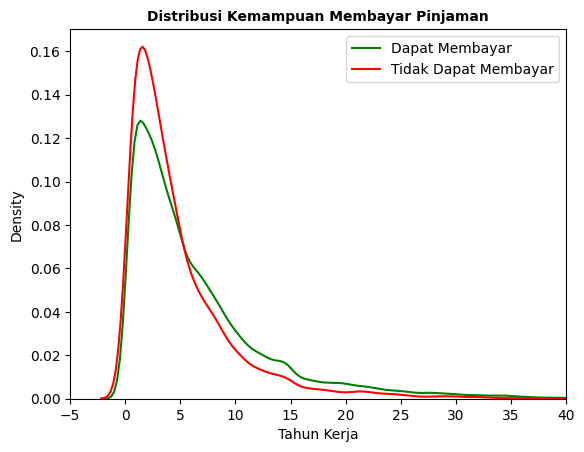

In [ ]:
# Distribusi kemampuan peminjam membayar pinjaman berdasarkan lama bekerja
plt.title("Distribusi Kemampuan Membayar Pinjaman",fontsize=10,weight="bold")
sns.distplot(df[df['TARGET']==0]['YEARS_EMPLOYED'], hist=False, label="Dapat Membayar", color = 'green')
sns.distplot(df[df['TARGET']==1]['YEARS_EMPLOYED'], hist=False, label="Tidak Dapat Membayar", color = 'red')
plt.xlim([-5,40])
plt.xlabel("Tahun Kerja")
plt.legend();

Dapat ditarik kesimpulan:

1.  Customer yang masa bekerja nya <5 tahun cenderung tidak dapat membayar pinjaman.

2.  Begitupun sebaliknya, Customer yang masa bekerjanya >5 tahun cenderung dapat membayar pinjaman.


##CNT_CHILDREN VS TARGET

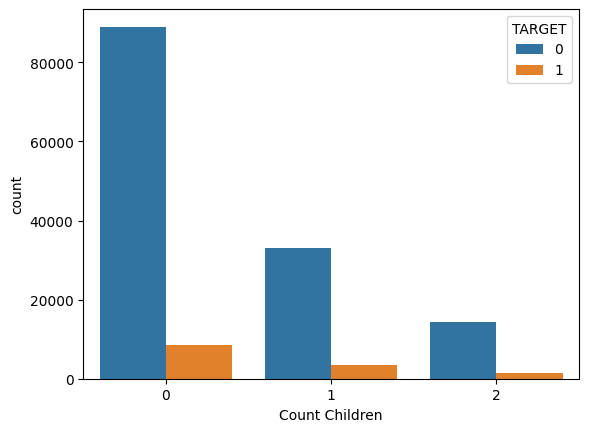

In [ ]:
fig = plt.figure()
ax = sns.countplot(data = df, x='CNT_CHILDREN', hue = 'TARGET')
ax.set_xlabel('Count Children')
plt.show()

In [ ]:
rcvt = pd.crosstab(df['CNT_CHILDREN'], df['TARGET'])
prcvt = df[['CNT_CHILDREN','TARGET']].groupby(['CNT_CHILDREN']).mean().sort_values(by=['TARGET'], ascending=False)
display(rcvt,prcvt)

TARGET,0,1
CNT_CHILDREN,,
0,89017,8500
1,32962,3374
2,14433,1422


,TARGET
CNT_CHILDREN,
1,0.092856
2,0.089688
0,0.087164


##AMOUNT INCOME VS TARGET

In [ ]:
sf_income = df[df['TARGET']==0]['AMT_INCOME_TOTAL']
dft_income = df[df['TARGET']==1]['AMT_INCOME_TOTAL']

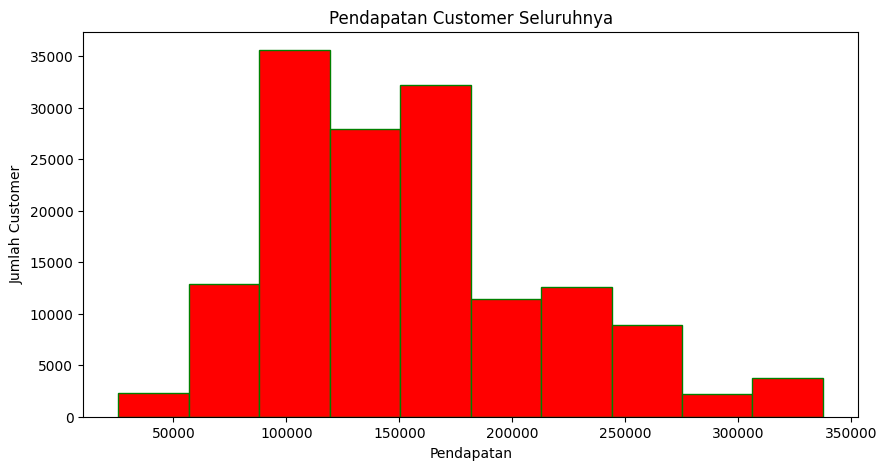

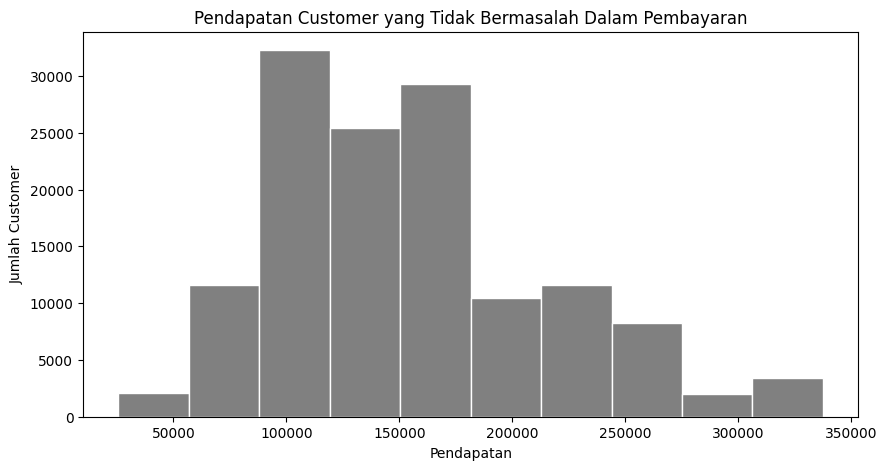

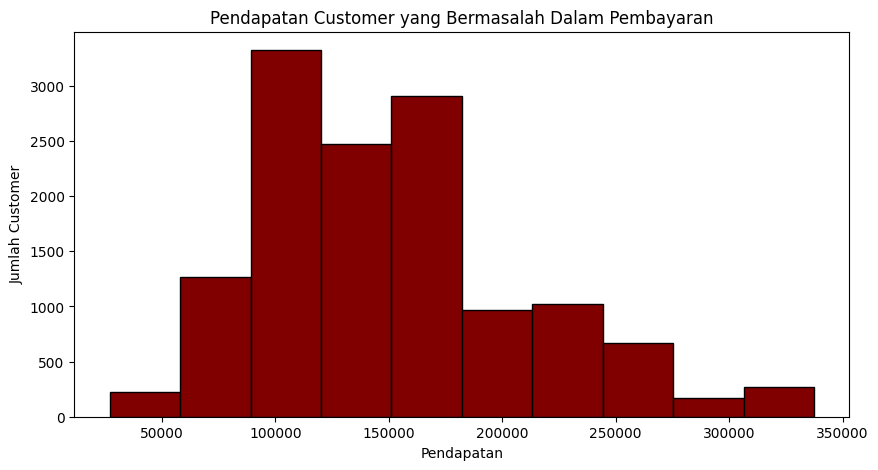

In [ ]:
plt.figure(figsize=(10,5))
plt.hist(df['AMT_INCOME_TOTAL'], bins=10, edgecolor='green', color='red')
plt.title('Pendapatan Customer Seluruhnya')
plt.xlabel('Pendapatan')
plt.ylabel('Jumlah Customer')
plt.show()

plt.figure(figsize=(10,5))
plt.hist(sf_income, bins=10, edgecolor='w', color='grey')
plt.title('Pendapatan Customer yang Tidak Bermasalah Dalam Pembayaran')
plt.xlabel('Pendapatan')
plt.ylabel('Jumlah Customer')
plt.show()

plt.figure(figsize=(10,5))
plt.hist(dft_income, bins=10, edgecolor='black', color='maroon')
plt.title('Pendapatan Customer yang Bermasalah Dalam Pembayaran')
plt.xlabel('Pendapatan')
plt.ylabel('Jumlah Customer')
plt.show()

In [ ]:
#Statistik kolom AMT_INCOME_TOTAL
df['AMT_INCOME_TOTAL'].describe()

count    149708.000000
mean     154776.474135
std       61657.342374
min       25650.000000
25%      112500.000000
50%      135000.000000
75%      193500.000000
max      337500.000000
Name: AMT_INCOME_TOTAL, dtype: float64

In [ ]:
#Membuat Boxplot Target By Amount Income Total
dfincome = df[df['TARGET']==0]['AMT_INCOME_TOTAL'].values*10


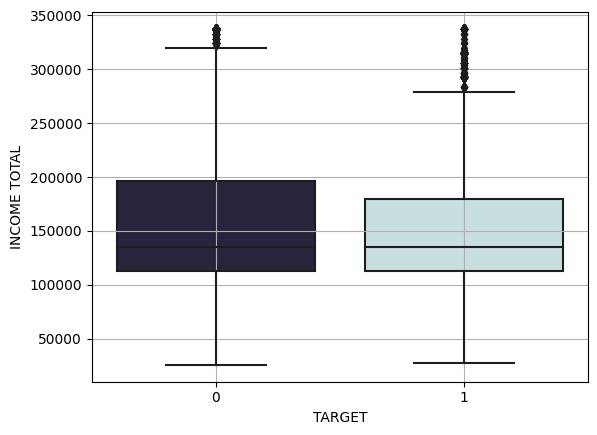

In [ ]:
sns.boxplot(x='TARGET', y='AMT_INCOME_TOTAL', data=df, palette = 'ch:start=0.2,rot=-.3_r')
plt.xlabel('TARGET')
plt.ylabel('INCOME TOTAL')
plt.grid()
plt.show()

Dapat dilihat bahwa customer yang default memiliki nilai maksimum income total yang lebih rendah dibandingkan dengan customer yang dapat membayar pinjaman. Selain itu, distribusi income total dari customer yang default paling banyak hanya berkisar antara 115000-180000 dimana lebih rendah dibandingkan customer yang dapat membayar pinjaman yaitu berkisar antara 115000-190000

#### Amount of Credit vs Target

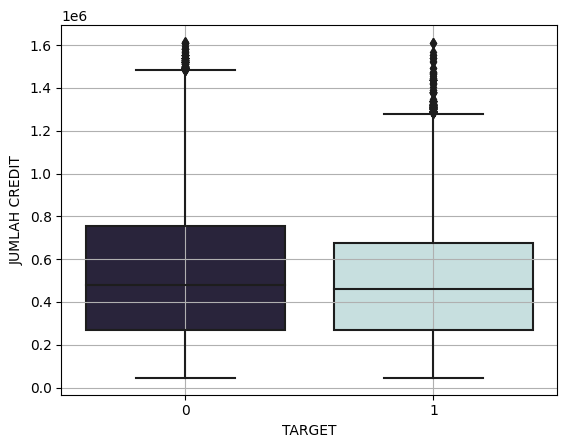

In [ ]:
sns.boxplot(x='TARGET', y='AMT_CREDIT', data=df, palette = 'ch:start=0.2,rot=-.3_r')
plt.xlabel('TARGET')
plt.ylabel('JUMLAH CREDIT')
plt.grid()
plt.show()

Dapat dilihat bahwa customer yang dapat membayar pinjaman memiliki distribusi jumlah kredit yang lebih merata dibandingkan dengan customer yang default.

#### Regional Rating vs Target

In [ ]:
rcvt = pd.crosstab(df['REGION_RATING_CLIENT'], df['TARGET'])
prcvt = df[['REGION_RATING_CLIENT','TARGET']].groupby(['REGION_RATING_CLIENT']).mean().sort_values(by=['TARGET'], ascending=False)
display(rcvt,prcvt)

TARGET,0,1
REGION_RATING_CLIENT,,
1,12853,731
2,101871,9557
3,21688,3008


,TARGET
REGION_RATING_CLIENT,
3,0.121801
2,0.085768
1,0.053813


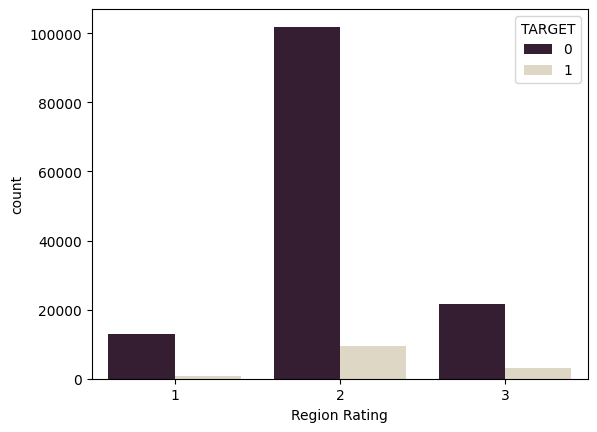

In [ ]:
fig = plt.figure()
ax = sns.countplot(data = df, x='REGION_RATING_CLIENT', hue = 'TARGET', palette = 'ch:start=0.3,rot=0.4_r')
ax.set_xlabel('Region Rating')
plt.show()

Dapat dilihat bahwa persentase customer yang default paling banyak adalah pada region rating 3.

### Bivariate Analysis Cats Terhadap Target

##Name Contract Type VS TARGET

In [ ]:
#Mengelompokkan target by Name Contract Type
etvt = pd.crosstab(df['NAME_CONTRACT_TYPE'], df['TARGET'])
petvt = df[['NAME_CONTRACT_TYPE','TARGET']].groupby(['NAME_CONTRACT_TYPE']).mean().sort_values(by=['TARGET'], ascending=False)
display(etvt,petvt)

TARGET,0,1
NAME_CONTRACT_TYPE,,
Cash loans,120165,12316
Revolving loans,16247,980


,TARGET
NAME_CONTRACT_TYPE,
Cash loans,0.092964
Revolving loans,0.056887


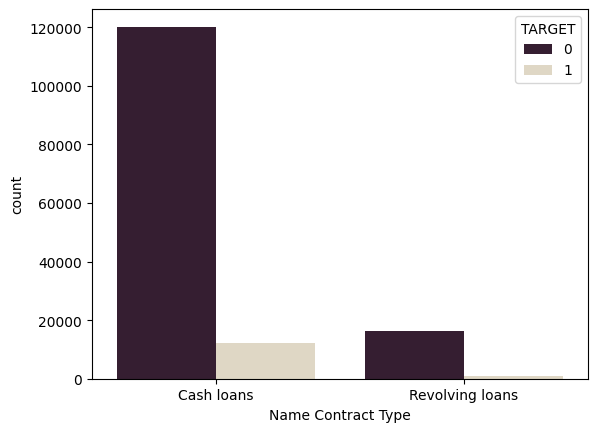

In [ ]:
#Tampilan boxplot target by Name Contract Type
fig = plt.figure()
ax = sns.countplot(data = df, x='NAME_CONTRACT_TYPE', hue = 'TARGET', palette = 'ch:start=0.3,rot=0.4_r')
ax.set_xlabel('Name Contract Type')
plt.show()

#### Gender vs Target

In [ ]:
#Mengelompokkan Taerget By Gender
agvt = pd.crosstab(df['CODE_GENDER'], df['TARGET'])
pagvt = df[['CODE_GENDER','TARGET']].groupby(['CODE_GENDER']).mean().sort_values(by=['TARGET'], ascending=False)
display(agvt,pagvt)

TARGET,0,1
CODE_GENDER,,
F,87357,7256
M,49055,6040


,TARGET
CODE_GENDER,
M,0.109629
F,0.076691


Dapat dilihat bahwa customer yang lebih banyak melakukan pinjaman adalah wanita . Namun, persentase customer pria untuk default  lebih banyak daripada customer wanita.

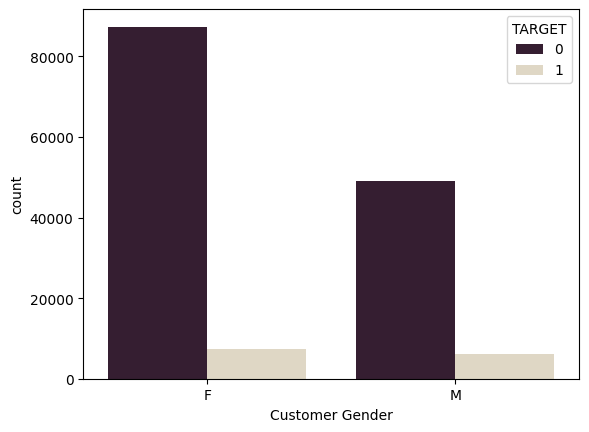

In [ ]:
#Tampilan boxplot target by gender
fig = plt.figure()
ax = sns.countplot(data = df, x='CODE_GENDER', hue = 'TARGET', palette = 'ch:start=0.3,rot=0.4_r')
ax.set_xlabel('Customer Gender')
plt.show()

#### Education vs Target

In [ ]:
#Mengelompokkan target by education
etvt = pd.crosstab(df['NAME_EDUCATION_TYPE'], df['TARGET'])
petvt = df[['NAME_EDUCATION_TYPE','TARGET']].groupby(['NAME_EDUCATION_TYPE']).mean().sort_values(by=['TARGET'], ascending=False)
display(etvt,petvt)

TARGET,0,1
NAME_EDUCATION_TYPE,,
Academic degree,63,0
Higher education,34102,2060
Incomplete higher,5304,525
Lower secondary,1277,211
Secondary / secondary special,95666,10500


,TARGET
NAME_EDUCATION_TYPE,
Lower secondary,0.141801
Secondary / secondary special,0.098902
Incomplete higher,0.090067
Higher education,0.056966
Academic degree,0.000000


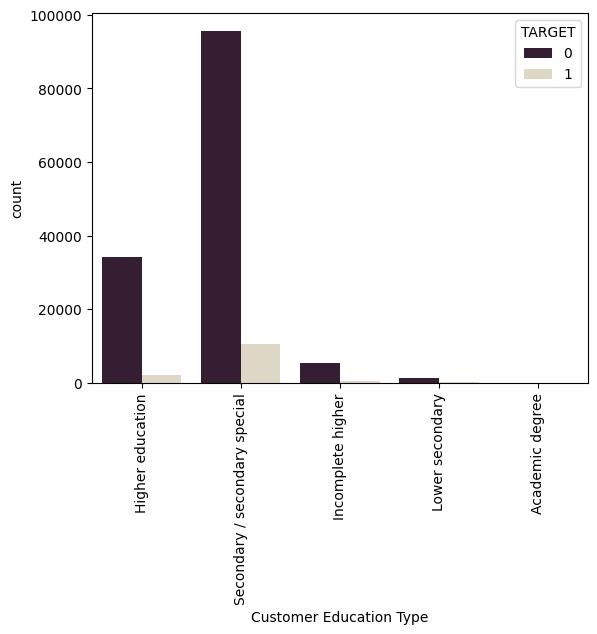

In [ ]:
fig = plt.figure()
ax = sns.countplot(data = df, x='NAME_EDUCATION_TYPE', hue = 'TARGET', palette = 'ch:start=0.3,rot=0.4_r')
ax.set_xlabel('Customer Education Type')
plt.xticks(rotation=90)
plt.show()
fig.set_dpi(600)

Dapat dilihat bahwa persentase customer default paling tinggi adalah pada Lower secondary.

#### Family Status vs Target

In [ ]:
#Mengelompokkan target by name family status
fvt = pd.crosstab(df['NAME_FAMILY_STATUS'], df['TARGET'])
pfvt = df[['NAME_FAMILY_STATUS','TARGET']].groupby(['NAME_FAMILY_STATUS']).mean().sort_values(by=['TARGET'], ascending=False)
display(fvt,pfvt)

TARGET,0,1
NAME_FAMILY_STATUS,,
Civil marriage,14712,1746
Married,86572,7748
Separated,8815,868
Single / not married,22386,2689
Widow,3927,245


,TARGET
NAME_FAMILY_STATUS,
Single / not married,0.107238
Civil marriage,0.106088
Separated,0.089642
Married,0.082146
Widow,0.058725


Dapat dilihat bahwa persentase customer default paling banyak adalah pada kelompok single.

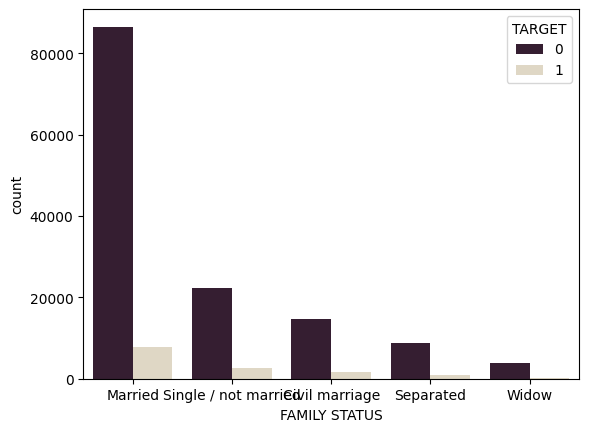

In [ ]:
fig = plt.figure()
ax = sns.countplot(data = df, x='NAME_FAMILY_STATUS', hue = 'TARGET', palette = 'ch:start=0.3,rot=0.4_r')
ax.set_xlabel('FAMILY STATUS')
plt.show()
fig.set_dpi(200)

#### Ocupation vs Target

In [ ]:
otvt = pd.crosstab(df['OCCUPATION_TYPE'], df['TARGET'])
potvt = df[['OCCUPATION_TYPE','TARGET']].groupby(['OCCUPATION_TYPE']).mean().sort_values(by=['TARGET'], ascending=False)
display(otvt,potvt)

TARGET,0,1
OCCUPATION_TYPE,,
Accountants,5178,267
Cleaning staff,2703,298
Cooking staff,3413,398
Core staff,15279,1030
Drivers,9726,1280
HR staff,285,22
High skill tech staff,6271,414
IT staff,281,21
Laborers,52440,5609


,TARGET
OCCUPATION_TYPE,
Low-skill Laborers,0.169383
Drivers,0.116300
Security staff,0.115152
Waiters/barmen staff,0.106774
Cooking staff,0.104435
Cleaning staff,0.099300
Sales staff,0.097127
Laborers,0.096625
Realty agents,0.075221


Dapat dilihat bahwa persentase customer default paling banyak adalah Low-Skill Laborers.

#### Organization vs Target

In [ ]:
otvt = pd.crosstab(df['ORGANIZATION_TYPE'], df['TARGET'])
potvt = df[['ORGANIZATION_TYPE','TARGET']].groupby(['ORGANIZATION_TYPE']).mean().sort_values(by=['TARGET'], ascending=False)
display(otvt,potvt)

TARGET,0,1
ORGANIZATION_TYPE,,
Advertising,219,20
Agriculture,1388,166
Bank,1368,76
Business Entity Type 1,3259,285
Business Entity Type 2,5636,536
Business Entity Type 3,35685,3804
Cleaning,145,15
Construction,3469,487
Culture,214,13


,TARGET
ORGANIZATION_TYPE,
Industry: type 8,0.187500
Transport: type 3,0.167794
Industry: type 13,0.133333
Construction,0.123104
Trade: type 1,0.120192
Industry: type 1,0.116861
Industry: type 4,0.116236
Restaurant,0.115183
Realtor,0.109005


Dapat dilihat bahwa persentase customer default paling banyak adalah pada industry type 8.

#### Car Ownership vs Target

In [ ]:
covt = pd.crosstab(df['FLAG_OWN_CAR'], df['TARGET'])
pcovt = df[['FLAG_OWN_CAR','TARGET']].groupby(['FLAG_OWN_CAR']).mean().sort_values(by=['TARGET'], ascending=False)
display(covt,pcovt)

TARGET,0,1
FLAG_OWN_CAR,,
N,88261,9192
Y,48151,4104


,TARGET
FLAG_OWN_CAR,
N,0.094322
Y,0.078538


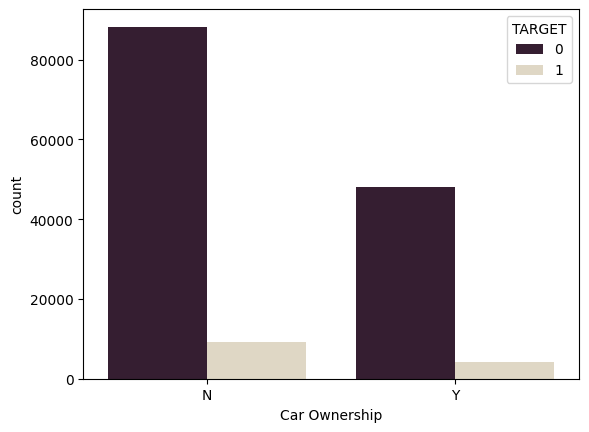

In [ ]:
fig = plt.figure()
ax = sns.countplot(data = df, x='FLAG_OWN_CAR', hue = 'TARGET', palette = 'ch:start=0.3,rot=0.4_r')
ax.set_xlabel('Car Ownership')
plt.show()
fig.set_dpi(200)

Dapat dilihat bahwa persentase customer default yang paling banyak adalah No Flag Own Car.

#### Reality Ownership vs Target

In [ ]:
rovt = pd.crosstab(df['FLAG_OWN_REALTY'], df['TARGET'])
provt = df[['FLAG_OWN_REALTY','TARGET']].groupby(['FLAG_OWN_REALTY']).mean().sort_values(by=['TARGET'], ascending=False)
display(rovt,provt)

TARGET,0,1
FLAG_OWN_REALTY,,
N,43864,4368
Y,92548,8928


,TARGET
FLAG_OWN_REALTY,
N,0.090562
Y,0.087981


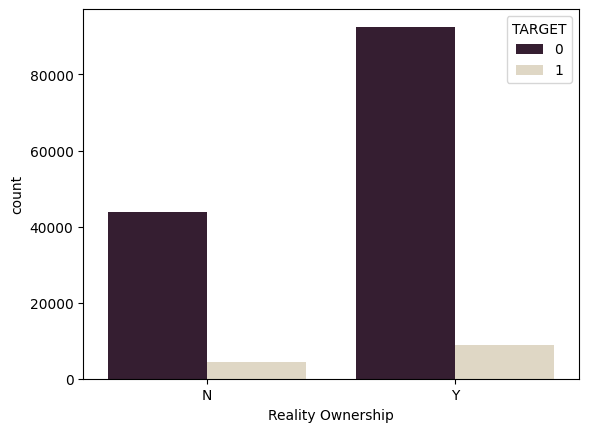

In [ ]:
fig = plt.figure()
ax = sns.countplot(data = df, x='FLAG_OWN_REALTY', hue = 'TARGET', palette = 'ch:start=0.3,rot=0.4_r')
ax.set_xlabel('Reality Ownership')
plt.show()
fig.set_dpi(200)

Dapat dilihat bahwa persentase customer default yang paling banyak adalah No Flag Own Realty.

#### Housing Type vs Target

In [ ]:
htvt = pd.crosstab(df['NAME_HOUSING_TYPE'], df['TARGET'])
phtvt = df[['NAME_HOUSING_TYPE','TARGET']].groupby(['NAME_HOUSING_TYPE']).mean().sort_values(by=['TARGET'], ascending=False)
display(htvt,phtvt)

TARGET,0,1
NAME_HOUSING_TYPE,,
Co-op apartment,548,47
House / apartment,118905,11154
Municipal apartment,4884,521
Office apartment,1239,90
Rented apartment,2613,382
With parents,8223,1102


,TARGET
NAME_HOUSING_TYPE,
Rented apartment,0.127546
With parents,0.118177
Municipal apartment,0.096392
House / apartment,0.085761
Co-op apartment,0.078992
Office apartment,0.067720


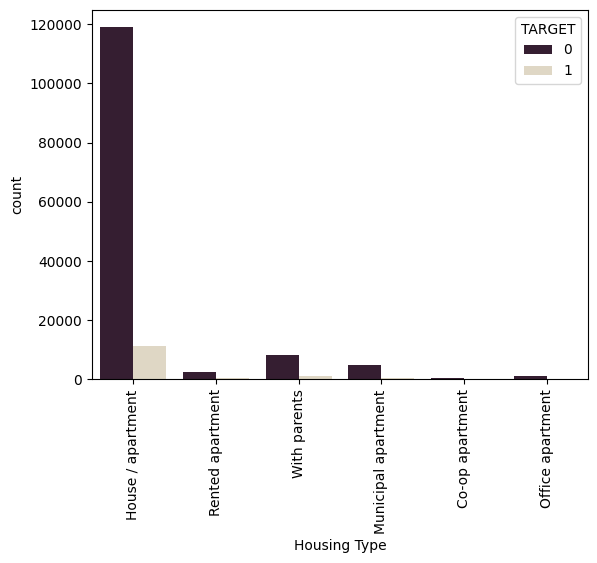

In [ ]:
fig = plt.figure()
ax = sns.countplot(data = df, x='NAME_HOUSING_TYPE', hue = 'TARGET', palette = 'ch:start=0.3,rot=0.4_r')
ax.set_xlabel('Housing Type')
plt.xticks(rotation=90)
plt.show()
fig.set_dpi(200)

Dapat dilihat bahwa persentase customer default yang paling banyak adalah dengan house type Rented apartment. Sedangkan persentase customer default yang paling sedikit adalah  house type Office apartment.

### Multivariate Analysis (Lintas Variabel)

#### Cek Korelasi antar Parameter

In [ ]:
correlations = df.corr("spearman")['TARGET'].sort_values(ascending=False)

print('Most Positive Correlations: \n', correlations)

Most Positive Correlations: 
 TARGET                               1.000000
REGION_RATING_CLIENT_W_CITY          0.063345
AGE                                  0.062495
REGION_RATING_CLIENT                 0.060632
FLAG_DOCUMENT_3                      0.043322
REG_CITY_NOT_WORK_CITY               0.043032
REG_CITY_NOT_LIVE_CITY               0.040230
LIVE_CITY_NOT_WORK_CITY              0.025357
FLAG_WORK_PHONE                      0.023896
AMT_REQ_CREDIT_BUREAU_YEAR           0.015334
AMT_ANNUITY                          0.011797
OBS_30_CNT_SOCIAL_CIRCLE zscore      0.007896
CNT_CHILDREN zscore                  0.007181
CNT_CHILDREN                         0.007181
FLAG_DOCUMENT_2                      0.006322
FLAG_CONT_MOBILE                     0.003213
FLAG_DOCUMENT_21                     0.003162
REG_REGION_NOT_WORK_REGION           0.002818
SK_ID_CURR                           0.001650
REG_REGION_NOT_LIVE_REGION           0.001624
FLAG_MOBIL                           0.000807
LIVE

In [ ]:
#Membuat dataframe baru untuk the most positive correlation dan the most negative correlation
df_corr = df[['TARGET','REGION_RATING_CLIENT_W_CITY','REGION_RATING_CLIENT','NAME_EDUCATION_TYPE','CODE_GENDER','NAME_CONTRACT_TYPE','AGE', 'YEARS_EMPLOYED', 'EXT_SOURCE_3','EXT_SOURCE_2']]
df_data_corrs = df_corr.corr()
df_data_corrs

,TARGET,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,AGE,YEARS_EMPLOYED,EXT_SOURCE_3,EXT_SOURCE_2
TARGET,1.000000,0.063203,0.060563,0.062518,-0.073683,-0.150440,-0.172236
REGION_RATING_CLIENT_W_CITY,0.063203,1.000000,0.953742,0.028070,0.015199,-0.011563,-0.272781
REGION_RATING_CLIENT,0.060563,0.953742,1.000000,0.029382,0.014800,-0.011816,-0.277826
AGE,0.062518,0.028070,0.029382,1.000000,-0.354373,-0.155599,-0.146255
YEARS_EMPLOYED,-0.073683,0.015199,0.014800,-0.354373,1.000000,0.112034,0.090196
EXT_SOURCE_3,-0.150440,-0.011563,-0.011816,-0.155599,0.112034,1.000000,0.101371
EXT_SOURCE_2,-0.172236,-0.272781,-0.277826,-0.146255,0.090196,0.101371,1.000000


Dapat diketahui variabel yang paling berpengaruh terhadap target adalah REGION_RATING_CLIENT_W_CITY dengan korelasi positif, dan YEARS _EMPLOYED dengan korelasi negatif

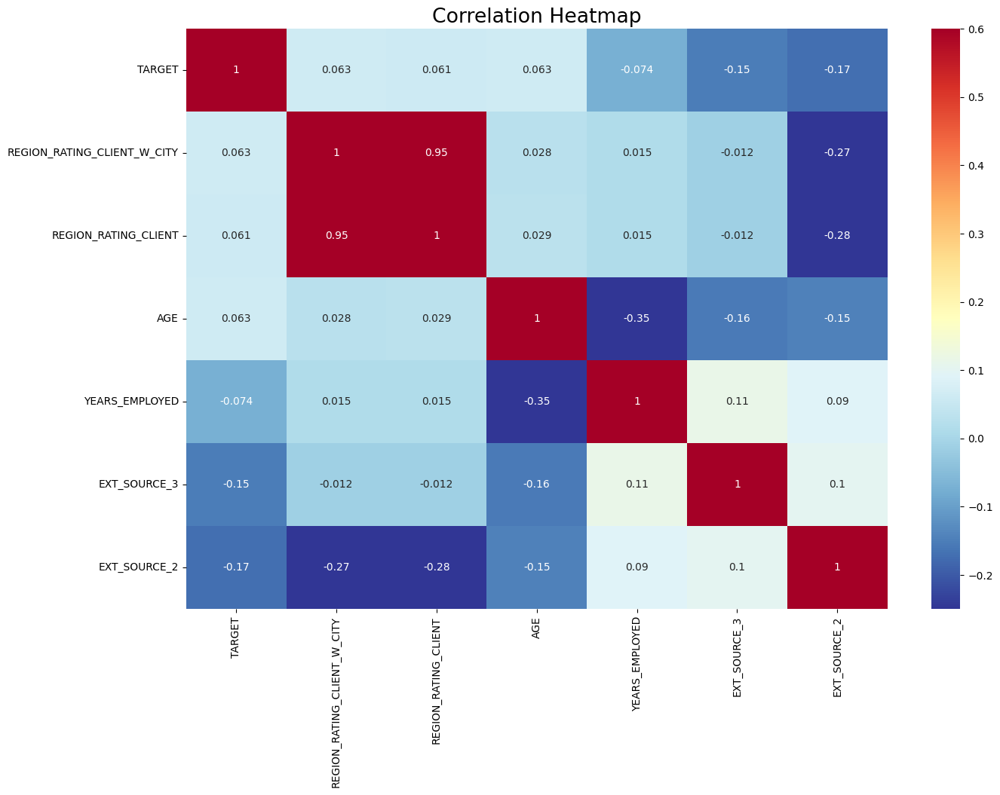

In [ ]:
plt.figure(figsize = (15, 10))

sns.heatmap(df_data_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)

sns.set_context('paper', font_scale=2)
plt.title('Correlation Heatmap');

####  Gender, Amount Credit, Target, and Region Rating

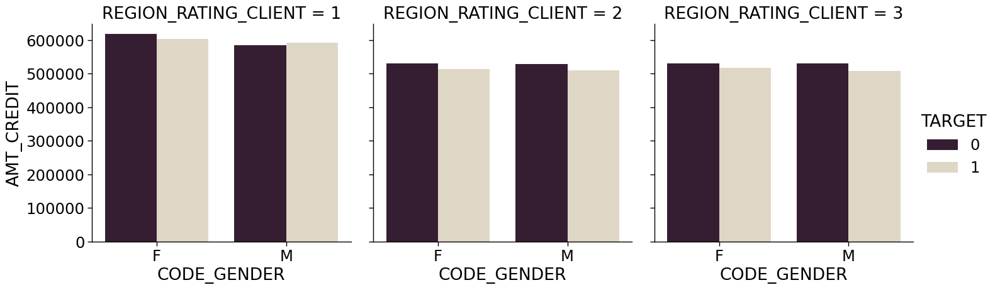

In [ ]:
sns.catplot(x = 'CODE_GENDER',
            y = 'AMT_CREDIT',
            hue = 'TARGET',
            col = 'REGION_RATING_CLIENT',
            kind = 'bar', palette = 'ch:start=0.3,rot=0.4_r',
            ci =None,
            data = df)
plt.show()

#### Housing Type, Amount of Credit, Target, and Region Rating

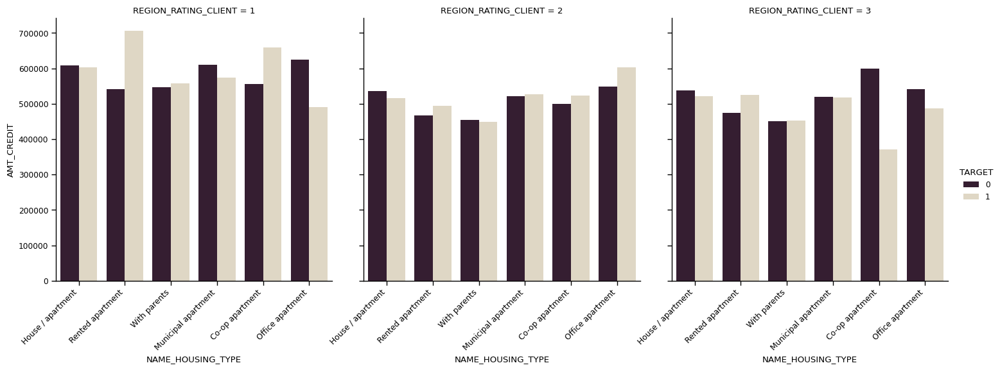

In [ ]:
sns.set_context('paper', font_scale=1)
fig = sns.catplot(x = 'NAME_HOUSING_TYPE',
            y = 'AMT_CREDIT',
            hue = 'TARGET',
            col = 'REGION_RATING_CLIENT',
            kind = 'bar', palette = 'ch:start=0.3,rot=0.4_r',
            ci =None,
            data = df)
fig.set_xticklabels(rotation=45, horizontalalignment='right')
plt.show()

#### Income Type, Amount of Income, Target, and Region Rating

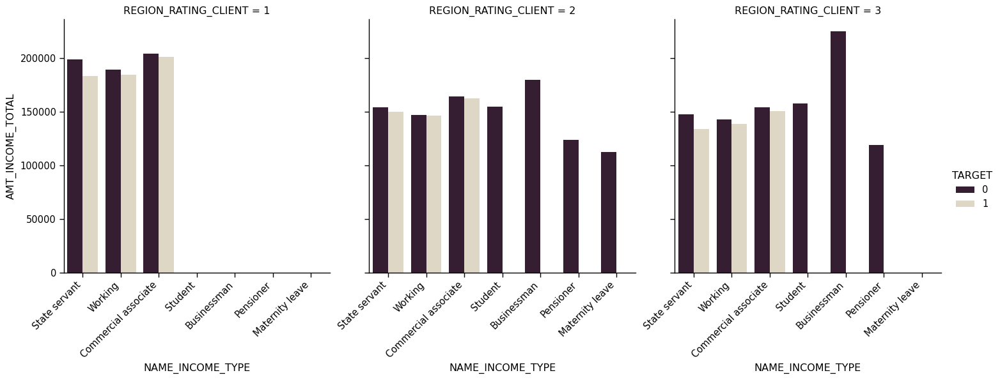

In [ ]:
sns.set_context('paper', font_scale=1.2)
fig = sns.catplot(x = 'NAME_INCOME_TYPE',
            y = 'AMT_INCOME_TOTAL',
            hue = 'TARGET',
            col = 'REGION_RATING_CLIENT',
            kind = 'bar', palette = 'ch:start=0.3,rot=0.4_r',
            ci =None,
            data = df)
fig.set_xticklabels(rotation=45, horizontalalignment='right')
plt.show()

#### Family Status, Amount of Credit, Target, and Car Ownership

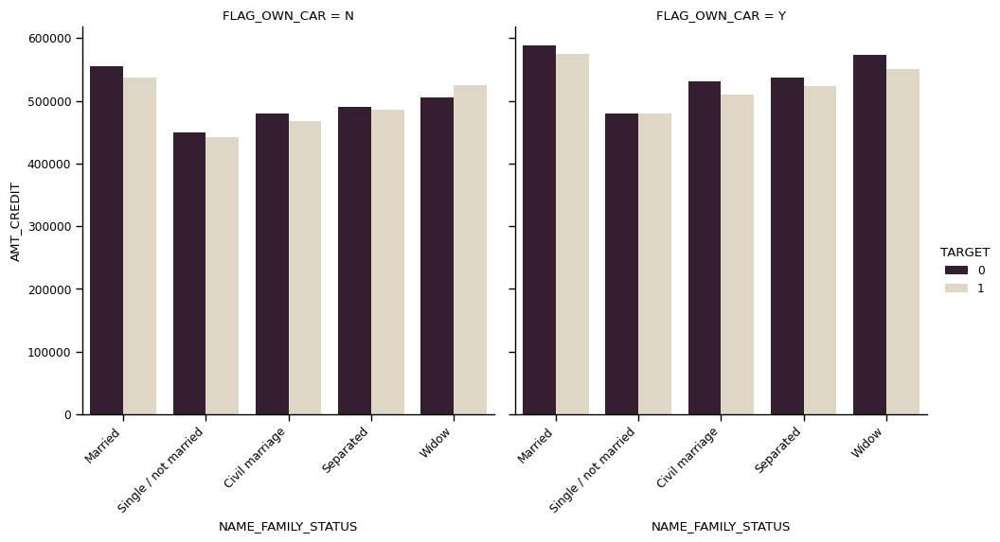

In [ ]:
sns.set_context('paper', font_scale=1)
fig = sns.catplot(x = 'NAME_FAMILY_STATUS',
            y = 'AMT_CREDIT',
            hue = 'TARGET',
            col = 'FLAG_OWN_CAR',
            kind = 'bar', palette = 'ch:start=0.3,rot=0.4_r',
            ci =None,
            data = df)
fig.set_xticklabels(rotation=45, horizontalalignment='right')
plt.show()

#### Family Status, Amount of Credit, Target, and Gender

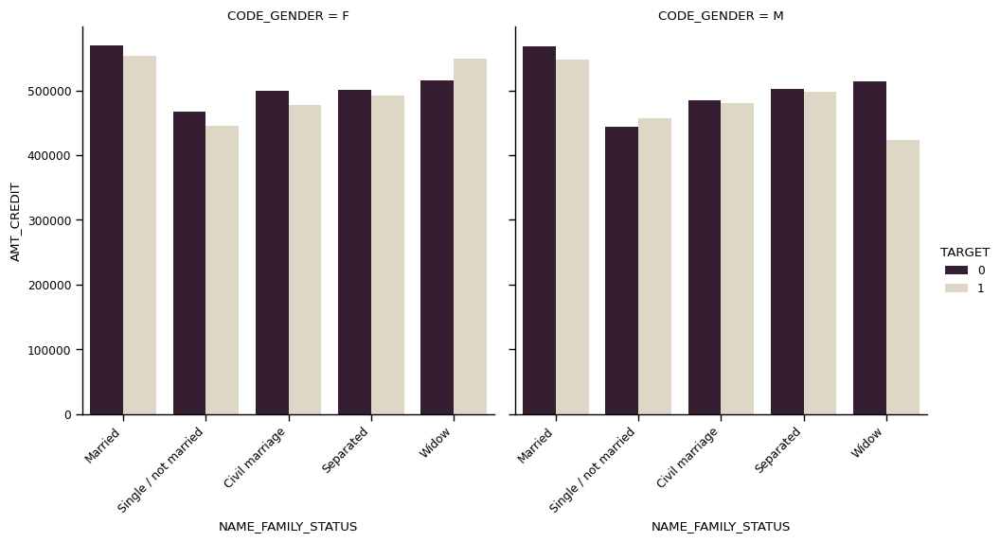

In [ ]:
sns.set_context('paper', font_scale=1)
fig = sns.catplot(x = 'NAME_FAMILY_STATUS',
            y = 'AMT_CREDIT',
            hue = 'TARGET',
            col = 'CODE_GENDER',
            kind = 'bar', palette = 'ch:start=0.3,rot=0.4_r',
            ci =None,
            data = df)
fig.set_xticklabels(rotation=45, horizontalalignment='right')
plt.show()

#### Family Status, Amount of Income, Target, and Realty Ownership

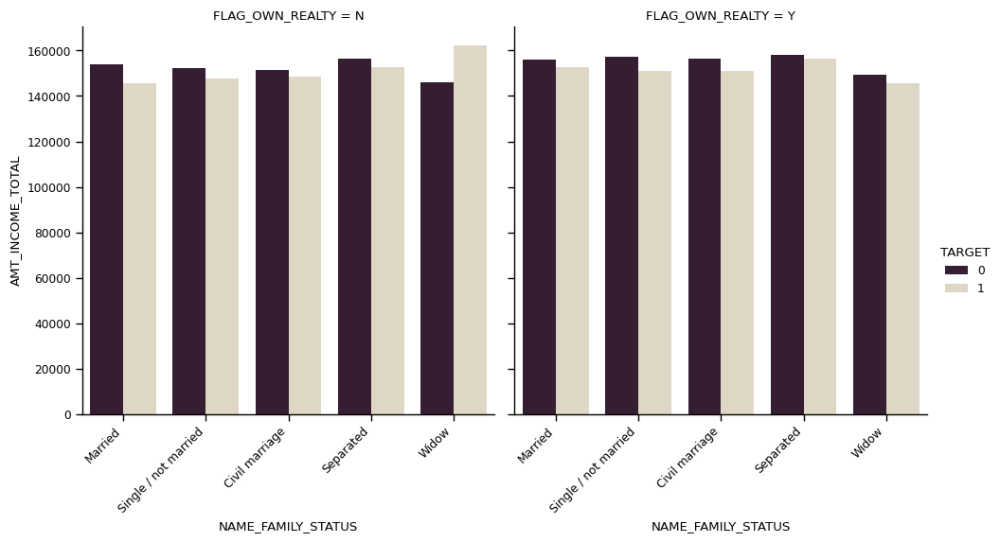

In [ ]:
sns.set_context('paper', font_scale=1)
fig = sns.catplot(x = 'NAME_FAMILY_STATUS',
            y = 'AMT_INCOME_TOTAL',
            hue = 'TARGET',
            col = 'FLAG_OWN_REALTY',
            kind = 'bar', palette = 'ch:start=0.3,rot=0.4_r',
            ci =None,
            data = df)
fig.set_xticklabels(rotation=45, horizontalalignment='right')
plt.show()

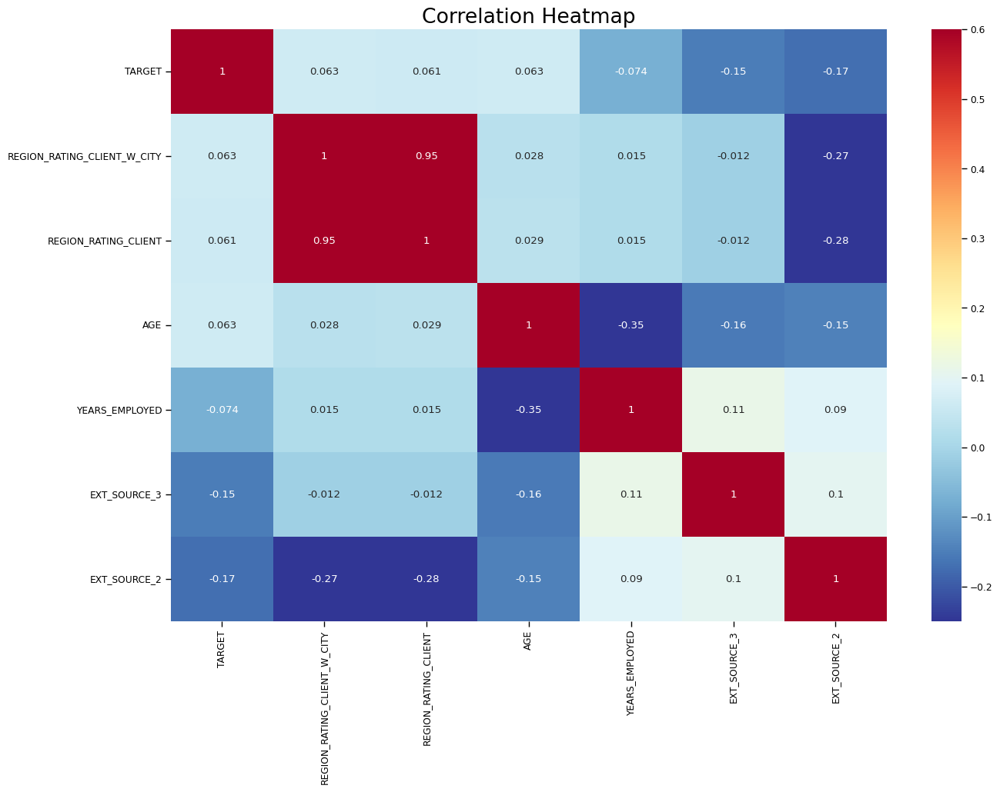

In [ ]:
plt.figure(figsize = (15, 10))

sns.heatmap(df_data_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)

sns.set_context('paper', font_scale=2)
plt.title('Correlation Heatmap');

##Categorical data encoding

### One Hot Encoding

In [ ]:
df_ohe=pd.get_dummies(df)
df_ohe.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore,CNT_CHILDREN zscore,AMT_REQ_CREDIT_BUREAU_MON zscore,YEARS_REGISTRATION zscore,OBS_30_CNT_SOCIAL_CIRCLE zscore,AMT_ANNUITY zscore,AMT_GOODS_PRICE zscore,AMT_REQ_CREDIT_BUREAU_WEEK zscore,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,CODE_GENDER_F,CODE_GENDER_M,FLAG_OWN_CAR_N,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_N,FLAG_OWN_REALTY_Y,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORG

### Label Encoding

In [ ]:
#Membuat df baru untuk label encoding
df_le= df

In [ ]:
from sklearn.preprocessing import LabelEncoder

df_le[["CODE_GENDER", "NAME_CONTRACT_TYPE", "FLAG_OWN_CAR", "FLAG_OWN_REALTY",
          "NAME_TYPE_SUITE", "NAME_INCOME_TYPE", "NAME_EDUCATION_TYPE", "NAME_FAMILY_STATUS",
         "NAME_HOUSING_TYPE", "OCCUPATION_TYPE", "WEEKDAY_APPR_PROCESS_START", "ORGANIZATION_TYPE"]] = df[["CODE_GENDER", "NAME_CONTRACT_TYPE", "FLAG_OWN_CAR", "FLAG_OWN_REALTY",
          "NAME_TYPE_SUITE", "NAME_INCOME_TYPE", "NAME_EDUCATION_TYPE", "NAME_FAMILY_STATUS",
         "NAME_HOUSING_TYPE", "OCCUPATION_TYPE", "WEEKDAY_APPR_PROCESS_START", "ORGANIZATION_TYPE"]].apply(LabelEncoder().fit_transform)

In [ ]:
#cek label encoding
df.shape

(149708, 91)

In [ ]:
df_le.shape

(149708, 91)

In [ ]:
df_ohe.shape

(149708, 200)

In [ ]:
df_le.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore,CNT_CHILDREN zscore,AMT_REQ_CREDIT_BUREAU_MON zscore,YEARS_REGISTRATION zscore,OBS_30_CNT_SOCIAL_CIRCLE zscore,AMT_ANNUITY zscore,AMT_GOODS_PRICE zscore,AMT_REQ_CREDIT_BUREAU_WEEK zscore
1,100003,0,0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,1,4,1,1,1,0.003541,-46,3.254795,3.249315,0.797260,1,1,0,1,1,0,3,2.0,1,1,1,11,0,0,0,0,0,0,39,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.316456,1.0,0.0,0.139595,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,0.0,4.0,1.725450,0.374388,0.653256,0.272466,1.068854,0.182313,0.740919,2.048915,0.158662
2,100004,0,1,1,1,1,0,67500.0,135000.0,6750.0,135000.0,6,6,4,3,1,0.010032,-52,0.616438,11.671233,6.934247,1,1,1,1,1,0,8,1.0,2,2,1,9,0,0,0,0,0,0,11,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.316456,0.0,0.0,0.155525,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,0.0,2.0,1.152888,0.406038,0.653256,0.272466,0.123655,0.616001,1.506577,1.163768,0.158662
3,100006,0,0,0,0,1,0,135000.0,312682.5,29686.5,297000.0,6,6,4,0,1,0.008019,-52,8.326027,26.939726,6.676712,1,1,0,1,0,0,8,2.0,2,2,6,17,0,0,0,0,0,0,5,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,2.0,0.316456,2.0,0.0,0.398148,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,1.0,4.0,0.711430,0.145896,0.653256,0.272466,1.589942,0.251375,0.274161,0.640435,0.158662
4,100007,0,0,1,0,1,0,121500.0,513000.0,21865.5,513000.0,6,6,4,3,1,0.028663,-55,8.323288,11.810959,9.473973,1,1,0,1,0,0,3,1.0,2,2,4,11,0,0,0,0,1,1,37,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.316456,0.0,0.0,0.201059,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,0.0,1.0,0.213734,0.197925,0.653256,0.272466,0.107973,0.616001,0.333044,0.057342,0.158662
5,100008,0,0,1,0,1,0,99000.0,490495.5,27517.5,454500.0,5,4,4,1,1,0.035792,-46,4.350685,13.616438,1.306849,1,1,1,1,1,0,8,2.0,2,2,6,16,0,0,0,0,0,0,33,0.354225,0.621226,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,No,0.0,0.316456,0.0,0.0,1.953340,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,1.0,1.0,3.0,0.269648,0.284639,0.653256,0.272466,0.094657,0.616001,0.105765,0.131639,0.158662


In [ ]:
unique_value = df_le['EMERGENCYSTATE_MODE'].value_counts()
unique_value

No     148537
Yes      1171
Name: EMERGENCYSTATE_MODE, dtype: int64

In [ ]:
df_le['EMERGENCYSTATE_MODE'] = df_le['EMERGENCYSTATE_MODE'].replace({'No': 0, 'Yes': 1})
unique_value = df_le['EMERGENCYSTATE_MODE'].value_counts()
unique_value

0    148537
1      1171
Name: EMERGENCYSTATE_MODE, dtype: int64

In [ ]:
df_le.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,YEARS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN,AMT_CREDIT zscore,AMT_INCOME_TOTAL zscore,CNT_CHILDREN zscore,AMT_REQ_CREDIT_BUREAU_MON zscore,YEARS_REGISTRATION zscore,OBS_30_CNT_SOCIAL_CIRCLE zscore,AMT_ANNUITY zscore,AMT_GOODS_PRICE zscore,AMT_REQ_CREDIT_BUREAU_WEEK zscore
1,100003,0,0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,1,4,1,1,1,0.003541,-46,3.254795,3.249315,0.797260,1,1,0,1,1,0,3,2.0,1,1,1,11,0,0,0,0,0,0,39,0.622246,0.535276,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,0,1.0,0.316456,1.0,0.0,0.139595,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,0.0,4.0,1.725450,0.374388,0.653256,0.272466,1.068854,0.182313,0.740919,2.048915,0.158662
2,100004,0,1,1,1,1,0,67500.0,135000.0,6750.0,135000.0,6,6,4,3,1,0.010032,-52,0.616438,11.671233,6.934247,1,1,1,1,1,0,8,1.0,2,2,1,9,0,0,0,0,0,0,11,0.555912,0.729567,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,0,0.0,0.316456,0.0,0.0,0.155525,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,0.0,2.0,1.152888,0.406038,0.653256,0.272466,0.123655,0.616001,1.506577,1.163768,0.158662
3,100006,0,0,0,0,1,0,135000.0,312682.5,29686.5,297000.0,6,6,4,0,1,0.008019,-52,8.326027,26.939726,6.676712,1,1,0,1,0,0,8,2.0,2,2,6,17,0,0,0,0,0,0,5,0.650442,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,0,2.0,0.316456,2.0,0.0,0.398148,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,1.0,4.0,0.711430,0.145896,0.653256,0.272466,1.589942,0.251375,0.274161,0.640435,0.158662
4,100007,0,0,1,0,1,0,121500.0,513000.0,21865.5,513000.0,6,6,4,3,1,0.028663,-55,8.323288,11.810959,9.473973,1,1,0,1,0,0,3,1.0,2,2,4,11,0,0,0,0,1,1,37,0.322738,0.535276,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,0,0.0,0.316456,0.0,0.0,0.201059,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,0.0,0.0,1.0,0.213734,0.197925,0.653256,0.272466,0.107973,0.616001,0.333044,0.057342,0.158662
5,100008,0,0,1,0,1,0,99000.0,490495.5,27517.5,454500.0,5,4,4,1,1,0.035792,-46,4.350685,13.616438,1.306849,1,1,1,1,1,0,8,2.0,2,2,6,16,0,0,0,0,0,0,33,0.354225,0.621226,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,0,0.0,0.316456,0.0,0.0,1.953340,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.063756,0.059696,0.0,0.0,1.0,1.0,3.0,0.269648,0.284639,0.653256,0.272466,0.094657,0.616001,0.105765,0.131639,0.158662


Dapat dilihat pada label encoding tidak terjadi penambahan kolom ,berbeda dengan one hot encoding. Untuk memudahkan proses modelling, maka digunakan label encoding karena tidak ada penambahan kolom.

# **Modeling**

In [ ]:
# Define feature and target
X = df_le.drop('TARGET', axis=1)
y = df_le['TARGET']

In [ ]:
# Split data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Logistic Regression

### SMOTE

Karena data TARGET imbalanced (banyak 0 dan 1 tidak seimbang) dapat diatasi dengan SMOTE

<Axes: title={'center': 'Distribution Before SMOTE'}, xlabel='TARGET'>

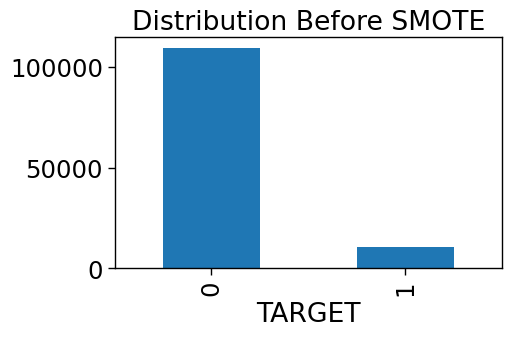

In [ ]:
# Melihat distribusi TARGET imbalanced before SMOTE
plt.figure(figsize=(5,3))
pd.Series(y_train).value_counts().plot(kind='bar', xlabel='TARGET', title='Distribution Before SMOTE')

In [ ]:
# import SMOTE module from imblearn library
from imblearn.over_sampling import SMOTE
sm = SMOTE()
X_train, y_train = sm.fit_resample(X_train, y_train)

In [ ]:
print("Before OverSampling, counts of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train == 0)))

print('After OverSampling, the shape of train_X: {}'.format(X_train.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_train == 1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train == 0)))

Before OverSampling, counts of label '1': 110977
Before OverSampling, counts of label '0': 110977 

After OverSampling, the shape of train_X: (221954, 91)
After OverSampling, the shape of train_y: (221954,) 

After OverSampling, counts of label '1': 110977
After OverSampling, counts of label '0': 110977


<Axes: title={'center': 'Distribution after applying SMOTE'}, xlabel='TARGET'>

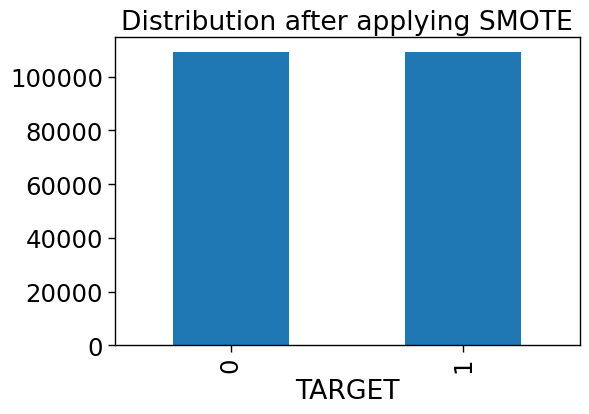

In [ ]:
# Distribution TARGET after applying SMOTE
plt.figure(figsize=(6,4))
pd.Series(y_train).value_counts().plot(kind='bar',
title='Distribution after applying SMOTE', xlabel='TARGET')

### Model

In [ ]:
# Model fitting (menyesuaikan model dengan data)
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)

In [ ]:
# Model summary
import statsmodels.api as sm
logit = sm.Logit(y,X)


In [ ]:
result = logit.fit()
print(result.summary2())

         Current function value: inf
         Iterations: 35


LinAlgError: ignored

In [ ]:
# Skor akurasi dari pemodelan regresi logistik pada data test
logreg = LogisticRegression()
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression: {:.2f}'.format(logreg.score(X_test, y_test)))

NotFittedError: ignored

In [ ]:
acc_score = accuracy_score(y_test, y_pred)
print("Logistic Regression model accuracy (%):", acc_score*100)

Logistic Regression model accuracy (%): 91.00928461692605


### Confusion Matrix

Confusion Matrix:  [[27250     0]
 [ 2692     0]]


<Figure size 500x300 with 0 Axes>

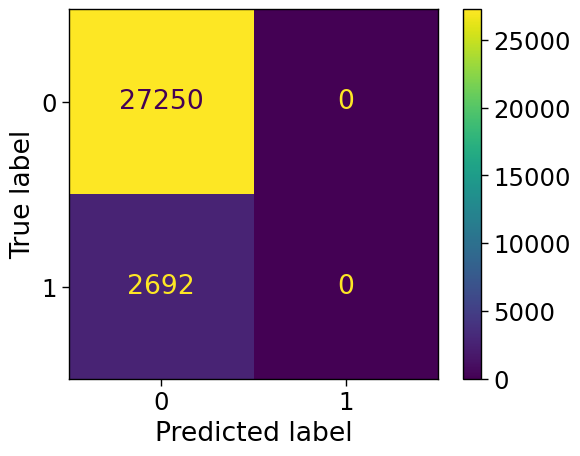

<Figure size 500x300 with 0 Axes>

In [ ]:
# Evaluasi kebaikan model dengan Confusion Matrix
print('Confusion Matrix: ', confusion_matrix(y_test, y_pred))
cm = metrics.confusion_matrix(y_test, y_pred)
viz = metrics.ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = [0,1])
viz.plot()
plt.figure(figsize=(5,3))

In [ ]:
akurasi = (14807 + 1605) / (14807+12915+1107+1605) * 100
APER = (100 - akurasi)
print('Nilai akurasi: ', akurasi, '%')
print('APER: ', APER, '%')

Nilai akurasi:  53.926529539331014 %
APER:  46.073470460668986 %


Dengan model logistric regression, terlihat bahwa performance model tidak baik karena hanya menghasilkan nilai akurasi sebesar 53.9%

### ROC-AUC

In [ ]:
y_pred_prob = logreg.predict_proba(X_test)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_prob)
print('ROC-AUC Score:', roc_auc)

ROC-AUC Score: 0.5374195509630982


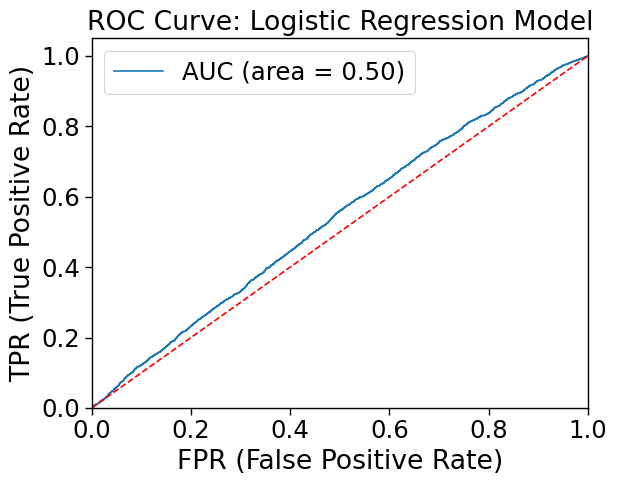

In [ ]:
# ROC-AUC juga untuk evaluasi model klasifikasi
# ROC curve based on nilai perhitungan dari confusion matrix
logit_roc_auc = roc_auc_score(y_test, y_pred)
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.legend()
plt.title('ROC Curve: Logistic Regression Model')
plt.xlabel('FPR (False Positive Rate)')
plt.ylabel('TPR (True Positive Rate)')
plt.savefig('Log_ROC')
plt.show()

In [ ]:
# Metrik untuk memeriksa seberapa baik model klasifikasi dalam memprediksi outcome
print('Classification Report: ')
print(classification_report(y_test, y_pred))

Classification Report: 
              precision    recall  f1-score   support

           0       0.91      1.00      0.95     27250
           1       0.00      0.00      0.00      2692

    accuracy                           0.91     29942
   macro avg       0.46      0.50      0.48     29942
weighted avg       0.83      0.91      0.87     29942



## Random Forest

In [ ]:
# Membuat model Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)

In [ ]:
# Melatih model
model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
# Memprediksi label target untuk data pengujian
y_pred = model.predict(X_test)

In [ ]:
#Skor akurasi
accuracy_rf = accuracy_score(y_test, y_pred)
print("Random Forest model accuracy (%):", accuracy_rf*100)

Random Forest model accuracy (%): 91.00928461692605


In [ ]:
recall_rf = recall_score(y_test, y_pred)
recall_rf

0.002600297176820208

In [ ]:
precision_rf = precision_score(y_test, y_pred)
precision_rf

0.5833333333333334

Confusion Matrix:  [[27245     5]
 [ 2685     7]]


<Figure size 500x300 with 0 Axes>

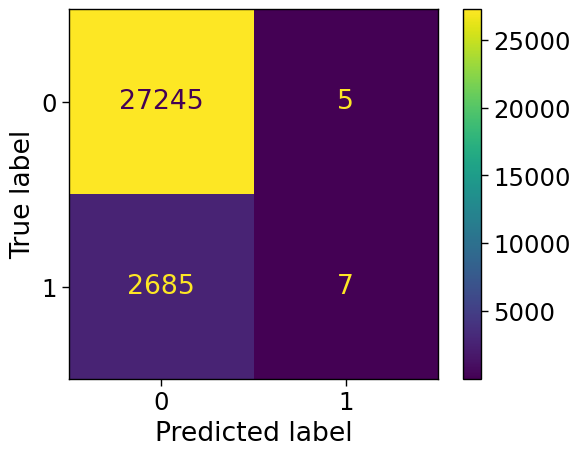

<Figure size 500x300 with 0 Axes>

In [ ]:
# Evaluasi kebaikan model dengan Confusion Matrix
print('Confusion Matrix: ', confusion_matrix(y_test, y_pred))
cm = metrics.confusion_matrix(y_test, y_pred)
viz = metrics.ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = [0,1])
viz.plot()
plt.figure(figsize=(5,3))

In [ ]:
# ROC-AUC
y_pred_prob = model.predict_proba(X_test)[:, 1]
roc_auc_rf = roc_auc_score(y_test, y_pred_prob)
('ROC-AUC Score:', roc_auc_rf)

('ROC-AUC Score:', 0.6984572228962471)

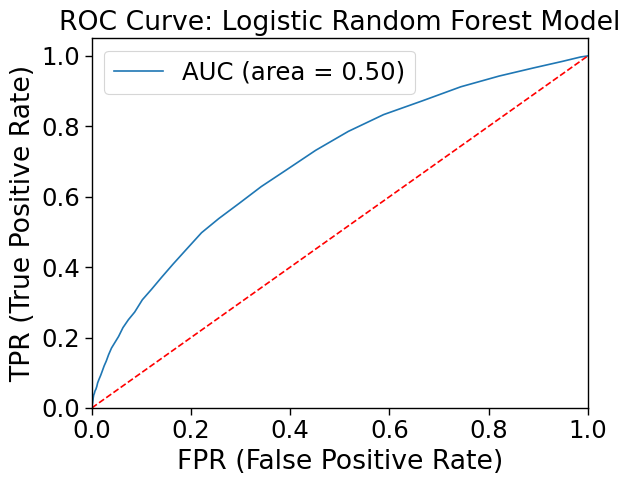

In [ ]:
# ROC-AUC juga untuk evaluasi model klasifikasi
# ROC curve based on nilai perhitungan dari confusion matrix
random_roc_auc = roc_auc_score(y_test, y_pred)
fpr, tpr, thresholds = roc_curve(y_test, model.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % random_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.legend()
plt.title('ROC Curve: Logistic Random Forest Model')
plt.xlabel('FPR (False Positive Rate)')
plt.ylabel('TPR (True Positive Rate)')
plt.savefig('Random Forest_ROC')
plt.show()

In [ ]:
#Metrik untuk memeriksa seberapa baik model klasifikasi dalam memprediksi outcome
classification_rep = classification_report(y_test, y_pred)
print('Classification Report:')
print(classification_rep)

Classification Report:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95     27250
           1       0.58      0.00      0.01      2692

    accuracy                           0.91     29942
   macro avg       0.75      0.50      0.48     29942
weighted avg       0.88      0.91      0.87     29942



## Naive Bayes

In [ ]:
# Membuat model Naive Bayes Classifier
gnb = GaussianNB()
gnb.fit(X_train, y_train)

GaussianNB()

In [ ]:
# Memprediksi label target untuk data pengujian
y_pred = gnb.predict(X_test)

In [ ]:
#Skor akurasi
accuracy_gnb = accuracy_score(y_test, y_pred)
print("Naive Bayes accuracy (%):", accuracy_gnb*100)

Naive Bayes accuracy (%): 91.00928461692605


Confusion Matrix:  [[27250     0]
 [ 2692     0]]


<Figure size 500x300 with 0 Axes>

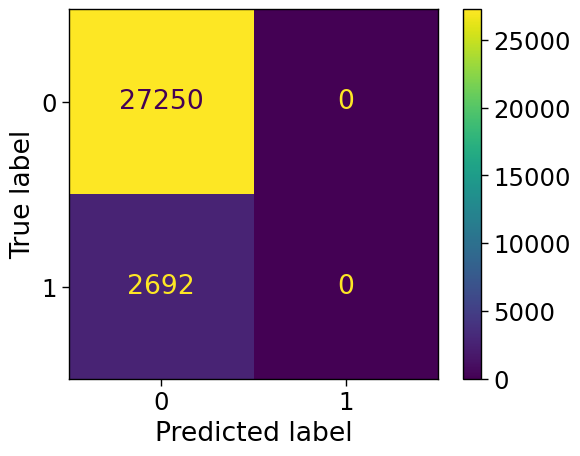

<Figure size 500x300 with 0 Axes>

In [ ]:
# Evaluasi kebaikan model dengan Confusion Matrix
print('Confusion Matrix: ', confusion_matrix(y_test, y_pred))
cm = metrics.confusion_matrix(y_test, y_pred)
viz = metrics.ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = [0,1])
viz.plot()
plt.figure(figsize=(5,3))

In [ ]:
# ROC-AUC
y_pred_prob = gnb.predict_proba(X_test)[:, 1]
roc_auc_gnb = roc_auc_score(y_test, y_pred_prob)
('ROC-AUC Score:', roc_auc_gnb)

('ROC-AUC Score:', 0.5902327657892226)

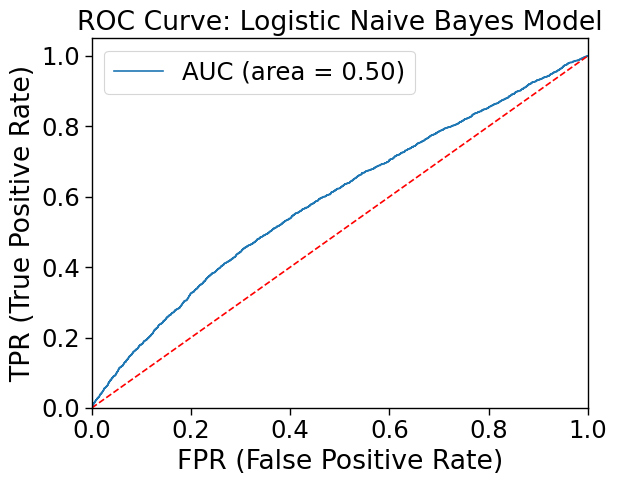

In [ ]:
# ROC-AUC juga untuk evaluasi model klasifikasi
# ROC curve based on nilai perhitungan dari confusion matrix
naive_roc_auc = roc_auc_score(y_test, y_pred)
fpr, tpr, thresholds = roc_curve(y_test, gnb.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % naive_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.legend()
plt.title('ROC Curve: Logistic Naive Bayes Model')
plt.xlabel('FPR (False Positive Rate)')
plt.ylabel('TPR (True Positive Rate)')
plt.savefig('Naibe Bayes_ROC')
plt.show()

In [ ]:
#Metrik untuk memeriksa seberapa baik model klasifikasi dalam memprediksi outcome
classification_rep = classification_report(y_test, y_pred)
print('Classification Report:')
print(classification_rep)

Classification Report:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95     27250
           1       0.00      0.00      0.00      2692

    accuracy                           0.91     29942
   macro avg       0.46      0.50      0.48     29942
weighted avg       0.83      0.91      0.87     29942



## Decision Tree

In [ ]:
# Create a decision tree classifier
dtree = DecisionTreeClassifier()

In [ ]:
# Train the classifier on the training data
dtree.fit(X_train, y_train)

DecisionTreeClassifier()

In [ ]:
# Make predictions on the test data
predictions_dtree = dtree.predict(X_test)

In [ ]:
# Calculate the accuracy of the model
accuracy_dtree = accuracy_score(y_test, predictions_dtree)
print("Decision Tree accuracy (%):", accuracy_dtree*100)

Decision Tree accuracy (%): 83.88217219958587


In [ ]:
# Print the confusion matrix of model Decision Tree
cm_dtree = metrics.confusion_matrix(y_test, predictions_dtree)
("Confusion Matrix : \n", cm_dtree)

('Confusion Matrix : \n',
 array([[24543,  2707],
        [ 2243,   449]]))

<Figure size 1000x1000 with 0 Axes>

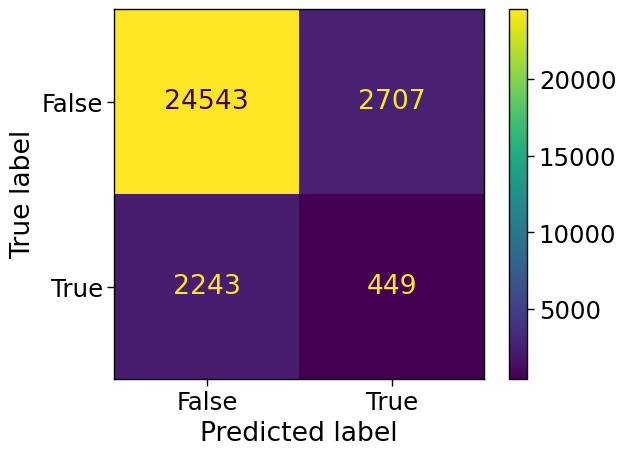

In [ ]:
# Visualize confusion matrix of model Decision Tree
plt.figure(figsize=(10,10))
confusion_matrix = metrics.confusion_matrix(y_test, predictions_dtree)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()

In [ ]:
# Menampilkan skor AUC model Decision Tree
roc_auc_dtree = roc_auc_score(y_test, dtree.predict_proba(X_test)[:,1])
('Skor AUC:',roc_auc_dtree)

('Skor AUC:', 0.5337255204002346)

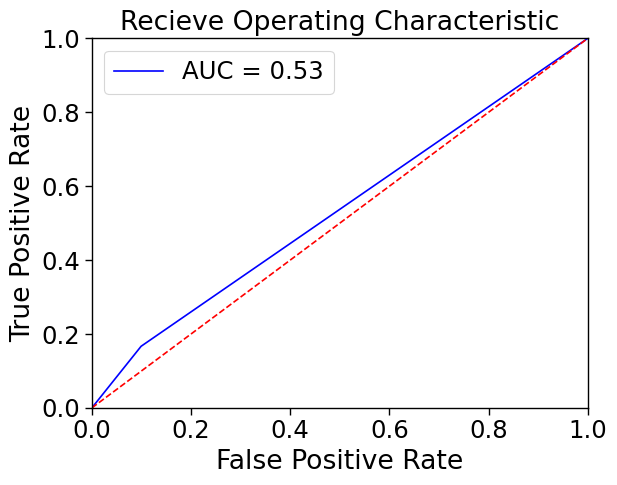

In [ ]:
# Menampilkan kurva AUC model Decision Tree
probs = dtree.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

plt.title('Recieve Operating Characteristic')
plt.plot(fpr, tpr, 'b', label="AUC = %0.2f" %roc_auc)
plt.legend()
plt.plot([0,1],[0,1],'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate');

In [ ]:
# Menampilkan report evaluasi model Decision Tree
print (classification_report(y_test, predictions_dtree))

              precision    recall  f1-score   support

           0       0.92      0.90      0.91     27250
           1       0.14      0.17      0.15      2692

    accuracy                           0.83     29942
   macro avg       0.53      0.53      0.53     29942
weighted avg       0.85      0.83      0.84     29942



In [ ]:
# Compare the model evaluation results
data_eval = {'Accuracy': [acc_score, accuracy_rf, accuracy_gnb, accuracy_dtree],
             'ROC-AUC': [logit_roc_auc, roc_auc_rf, roc_auc_gnb, roc_auc_dtree]}

model_eval = pd.DataFrame(data_eval, index=['Logistic Regression', 'Random Forest', 'Naive Bayes','Decision Tree'])
print("Comparsion of Models\n")
model_eval

Comparsion of Models



,Accuracy,ROC-AUC
Logistic Regression,0.910093,0.500000
Random Forest,0.910093,0.698457
Naive Bayes,0.910093,0.590233
Decision Tree,0.834680,0.533726


# **Feature Importance**

In [ ]:
X.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_BUREAU_LOAN
0,100002,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0
1,100003,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
2,100004,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [ ]:
y

0         1
1         0
2         0
3         0
4         0
5         0
6         0
7         0
8         0
9         0
10        0
11        0
12        0
13        0
14        0
15        0
16        0
17        0
18        0
19        0
20        0
21        0
22        0
23        0
24        0
25        0
26        1
27        0
28        0
29        0
30        0
31        0
32        0
33        0
34        0
35        0
36        0
37        0
38        0
39        0
40        1
41        0
42        1
43        0
44        0
45        0
46        0
47        0
48        0
49        0
50        0
51        0
52        0
53        0
54        0
55        0
56        0
57        0
58        0
59        0
60        0
61        0
62        0
63        0
64        0
65        0
66        0
67        0
68        0
69        0
70        0
71        0
72        0
73        0
74        0
75        0
76        0
77        0
78        0
79        0
80        0
81        1
82        0
83  

In [ ]:
# Menampilkan feature importance berdasarkan model Random Forest Classifier
features = X.columns
features_impt_rfc = pd.DataFrame(model.feature_importances_, columns=["SCORE"])
features_impt_rfc['FEATURE'] = features
feature_rfc = features_impt_rfc.sort_values('SCORE', ascending = False)
feature_rfc

,SCORE,FEATURE
39,6.343273e-02,EXT_SOURCE_2
40,5.432368e-02,EXT_SOURCE_3
17,4.214184e-02,YEARS_EMPLOYED
19,3.927538e-02,YEARS_ID_PUBLISH
18,3.828116e-02,YEARS_REGISTRATION
0,3.768696e-02,SK_ID_CURR
86,3.692675e-02,YEARS_REGISTRATION zscore
8,3.499254e-02,AMT_ANNUITY
53,3.450964e-02,YEARS_LAST_PHONE_CHANGE
82,3.075550e-02,AMT_CREDIT zscore


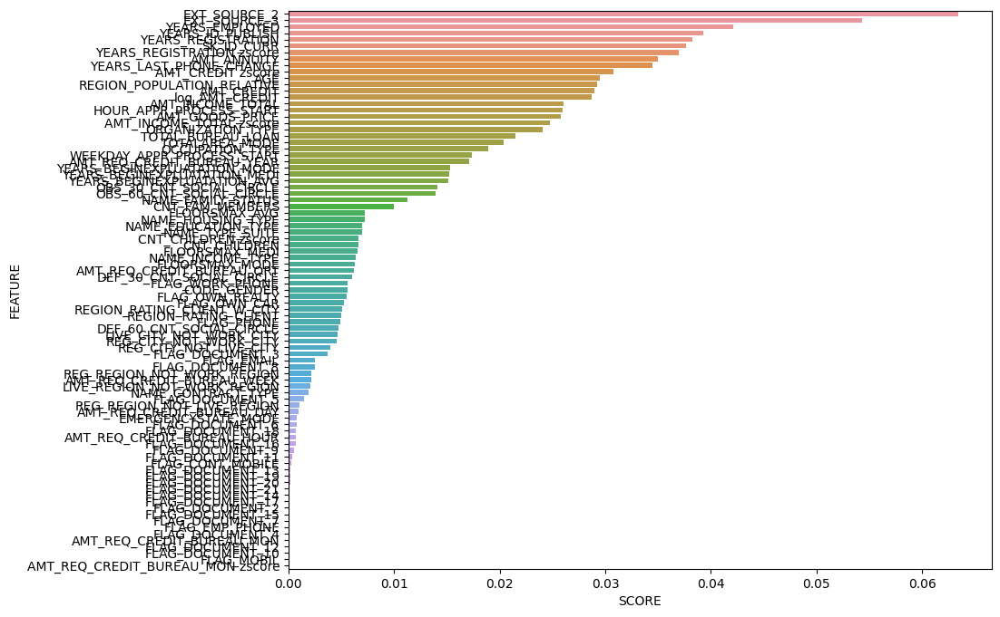

In [ ]:
# Visualisasi feature importance berdasarkan model Random Forest Classifier
plt.figure(figsize=(10,8))
sns.barplot(data=feature_rfc, x='SCORE', y='FEATURE', orient='h')
plt.show()

In [ ]:
#Menampilkan jumlah baris dan kolom dalam df
df.shape

(197548, 88)

# *Compile Data Dashboard*

In [ ]:
df.shape

(149708, 92)

In [ ]:
# determine which important columns/features to show in the dashboard
dash = df[['SK_ID_CURR','TARGET','NAME_CONTRACT_TYPE','CODE_GENDER','AGE',
              'AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE',
              'OCCUPATION_TYPE','WEEKDAY_APPR_PROCESS_START','NAME_FAMILY_STATUS',
           'CNT_CHILDREN','CNT_FAM_MEMBERS','YEARS_EMPLOYED','YEARS_REGISTRATION',
           '']]
dash.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,AGE,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,NAME_FAMILY_STATUS,CNT_CHILDREN,CNT_FAM_MEMBERS
1,100003,0,Cash loans,F,46,270000.0,1293502.5,35698.5,1129500.0,Core staff,MONDAY,Married,0,2.0
2,100004,0,Revolving loans,M,52,67500.0,135000.0,6750.0,135000.0,Laborers,MONDAY,Single / not married,0,1.0
3,100006,0,Cash loans,F,52,135000.0,312682.5,29686.5,297000.0,Laborers,WEDNESDAY,Civil marriage,0,2.0
4,100007,0,Cash loans,M,55,121500.0,513000.0,21865.5,513000.0,Core staff,THURSDAY,Single / not married,0,1.0
5,100008,0,Cash loans,M,46,99000.0,490495.5,27517.5,454500.0,Laborers,WEDNESDAY,Married,0,2.0


In [ ]:
dash.to_csv('data_for_dashboard.csv', encoding='utf-8', index=False)